# Overview

In this project, we will explore how to use Bayesian Networks (BN) and Hidden Markov Models (HMM) to predict price movements of front-month oil futures, with the end goal of demonstrating how this approach can provide a reliable signal for a profitable trading system.

In this project we will train a BN to predict the direction of oil future price movements using discretized inputs from HMM with discrete emissions (sign of price change).

In [1]:
from collections import Counter
import itertools
import json
import logging
import os
import requests
import time
import warnings

from dotenv import load_dotenv
from fredapi import Fred
import matplotlib.pyplot as plt
from myeia import API as meyeia_api
import networkx as nx
import numpy as np
import pandas as pd
from pgmpy.estimators import HillClimbSearch, BayesianEstimator, BIC, K2, BDeu
from pgmpy.factors.discrete import TabularCPD
from pgmpy.models import DiscreteBayesianNetwork
from pomegranate.distributions import Categorical
from pomegranate.hmm import DenseHMM
import seaborn as sns
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay, f1_score, 
    precision_score, recall_score, accuracy_score,
)
import yfinance as yf

load_dotenv()  # Load our secrets from the .env file

# We'll be fitting a lot of pgmpy models, so we will suppress those annoying logs
logging.getLogger("pgmpy").setLevel(logging.ERROR)  

# pgmpy raises a lot of these from pandas, so we will suppress the pandas FutureWarning
warnings.filterwarnings("ignore", category=FutureWarning)


BARS_PER_YEAR = 251  # Average trading days per year, rounded to nearest integer
START_DATE = "1900-01-01"
END_DATE = None
FRED_SESSION = Fred(api_key=os.getenv("FRED_API_KEY"))
EIA_SESSION = meyeia_api(token=os.getenv("EIA_API_KEY"))
TODAY = pd.to_datetime('today')
THIS_MONTH = pd.to_datetime(TODAY.strftime('%Y-%m'))
TARGET_FEATURE = 'CL=F'  # WTI Oil front month futures price
TARGET_LABEL = 'target'  # name we will use for the target feature
TARGET_HORIZON_DAYS = 5  # predict return over next 5 TRADING days


def get_freq_from_index(df: pd.DataFrame) -> pd.Timestamp:
    """Using the data's datetime index, classify its sampling frequency as 
    'annually', 'monthly', 'weekly', 'daily', or 'intraday'.
    """
    x = np.nanmean(df.index.diff().days)
    if 245 < x:  
        freq = 'annually'
    elif 28 <= x <= 31:
        freq = 'monthly'
    elif 3 <= x <= 7:  # Some trading weeks are short due to holidays
        freq = 'weekly'
    elif 1 <= x < 3:  # Weekends might shift the average within [1, 3)
        freq = 'daily'
    else:
        raise ValueError("Only daily or higher timeframes are permitted.")
    return freq

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


# Performance Metrics

Before we being building and evaluating the model, we should determine how we want to measure its performance. Ultimately, our goal is to predict whether WTI Oil futures will increase or decrease in price over the next 5 trading days. Since there are only two possible outcomes, this is a binary classification problem. We will want to measure:
- Precision, because a long-only strategy will depend heavily on how many of our "increase" guesses are correct.
- Accuracy, because a long-and-short strategy will depend heavily on our overall rate of correct guesses.
- Recall and the F1-score, because an analyst using a long-only strategy might be interested in how many opportunities they missed.

All of these metrics are implemented in SciPy, so we'll just import those functions.

Additionally, for any set of data that we try to predict, we want to know:
1. Is the model's performance significantly better than what would be expected by random guessing?
2. Is there statistically significant evidence of dependence (correlation) between the model's predictions and the actual outcomes?

For the first question, we can use SciPy's "chi2_contingency". For the second question, we can use a permutation test where we simulate a bunch of random scenarios with the same proportions of answers as our data, but shuffled around, and then compare our model's accuracy in the real world against its accuracy in the simulated random worlds.

In [2]:
def permutation_test(
    y_pred: np.ndarray, 
    y_true: np.ndarray,
    n_iter: int=10000,
    seed: int | None=None
) -> np.float64:
    """Conducts a permutation test under the null hypothesis that no structural information
    in y_true was modeled in y_pred. The test shuffles y_true for a total of n_iter different
    combinations (but does not shuffle y_pred) and computes the accuracy of y_pred with each 
    shuffled version of y_true. Returns the distribution of simulated accuracy metrics and the
    model's percentile within that distribution.
    """
    rng = np.random.default_rng(seed=None)
    
    x = np.tile(y_true.flatten(), (n_iter, 1)).T  # (n_answers, n_iter)
    rng.permuted(x, axis=0, out=x)

    for elem in np.unique(x):
        mu = (x == elem).mean(axis=0)
        assert np.all(mu == mu[0]), f"Distribution of {elem} not equal across all columns."
    
    accuracies = (x == y_pred.reshape(-1, 1)).mean(axis=0)
    model_accuracy = accuracy_score(y_true=y_true, y_pred=y_pred)

    percentile = max(
        (accuracies >= model_accuracy).mean(),
        1 / n_iter  # If none of the simulations beat the model, the minimum p-value is 1/n_iter.
    )
    return percentile, accuracies

# ETL

## Define Features

In [3]:
yf_features = [
    '^SPX',  # S&P 500 index
    'BZ=F',  # Brent Crude Oil front month futures price
    'CL=F',  # WTI Oil front month futures price
    'CVX',  # Chevron stock price
    'SHEL',  # Shell PLC stock price
    'XLE',  # Energy sector of S&P 500
    'XOM',  # Exxon Mobile stock price
]

fred_features = [
    'A24ATI',  # Manufacturers' Total Inventories: Petroleum Refineries
    'CAPG211S',  # Industrial Capacity: Mining: Oil and Gas Extraction
    'CAPUTLG211S',  # Capacity Utilization: Mining: Oil and Gas Extraction
    'CPIENGSL',  # Consumer Price Index for All Urban Consumers: Energy in U.S. City Average
    'IPG21112S',  # Industrial Production: Mining: Crude Oil
    'IPN213111N',  # Industrial Production: Mining: Drilling Oil and Gas Wells
    'INDPRO',  # Industrial Production: Total Index
    'OVXCLS',  # CBOE Crude Oil ETF Volatility Index
    'PCU211211',  # Producer Price Index by Industry: Oil and Gas Extraction
    'WTISPLC',  # Spot Crude Oil Price: West Texas Intermediate
]

eia_features = [
    # Total OPEC Petroleum Supply (million barrels per day)
    dict(
        route="steo",
        series="PAPR_OPEC",
        frequency="monthly",
        facet="seriesId",
    ), 
    # U.S. Crude Oil Proved Reserves (Million Barrels) - up to 2023
    dict(
        route="petroleum/crd/pres",
        series="RCRR01NUS_1",
        frequency="annual",
        facet="series",
    ), 
    # U.S. Federal Offshore Crude Oil Proved Reserves (Million Barrels) - up to 2023 
    dict(
        route="petroleum/crd/pres",
        series="RCRR01R48F_1",
        frequency="annual",
        facet="series",
    ),
    # U.S. Product Supplied of Finished Motor Gasoline (Thousand Barrels per Day) 
    dict(
        route="petroleum/cons/wpsup",
        series="WGFUPUS2",
        frequency="weekly",
        facet="series",
    ), 
]

## Extract Data from Online Sources

Since Yahoo Finance, FRED, and EIA have various sorting schemes, we will handle datetime index sorting immediately and all other data transformations later.

In [4]:
feature_freq_lag = []


print("Downloading Yahoo Finance data...")
yf_df = yf.download(
    yf_features, start=START_DATE, end=END_DATE, auto_adjust=True
).sort_values(by='Date', ascending=True)['Close']


print("Downloading FRED data...")
fred_datalist = []
for feature in fred_features:
    tmp = pd.DataFrame(FRED_SESSION.get_series(feature).sort_index(ascending=True))
    tmp.columns = [feature]
    tmp.index = pd.to_datetime(tmp.index)
    fred_datalist.append(tmp)
    ffl = {
        'feature': feature,
        'frequency': get_freq_from_index(tmp),
        'lag [days]': (TODAY - tmp.index[-1]).days
    }
    feature_freq_lag.append(ffl)


print("Downloading EIA data...")
eia_datalist = []
for feature_dict in eia_features:
    tmp = EIA_SESSION.get_series_via_route(**feature_dict).sort_values(by='Date', ascending=True)
    tmp.columns = [feature_dict['series']]
    eia_datalist.append(tmp)
    ffl = {
        'feature': feature_dict['series'],
        'frequency': get_freq_from_index(tmp),
        'lag [days]': (TODAY - tmp.index[-1]).days
    }
    feature_freq_lag.append(ffl)


datalist = [yf_df] + fred_datalist + eia_datalist
ffl_df = pd.DataFrame(feature_freq_lag)
display(ffl_df)

[*********************100%***********************]  7 of 7 completed


,feature,frequency,lag [days]
0,A24ATI,monthly,92
1,CAPG211S,monthly,62
2,CAPUTLG211S,monthly,62
3,CPIENGSL,monthly,62
4,IPG21112S,monthly,62
5,IPN213111N,monthly,62
6,INDPRO,monthly,62
7,OVXCLS,daily,4
8,PCU211211,monthly,62
9,WTISPLC,monthly,62


The table above shows that most of the economic data is sampled on a monthly basis, but two are sampled annually, one weekly, and one daily. These series will have to be shifted by different amounts to account for their different sampling frequencies and lags. Surprisingly, one of the feature (PAPR_OPEC) has a *negative* lag, indicating that it's most recently available measurement corresponds to a point in the future. A closer look at the EIA's description of this feature explains why: it is a forecast of OPEC's petroleum supply provided by the EIA's Short Term Energy Outlook. Since none of our other features contain information corresponding with future timestamps, we will limit the availability of this one feature up to the present day within our model -- meaning that our model will only be able to access up to the prediction that was previously made for the present day. That said, it might be interesting to explore the impact of the one-month PAPR_OPEC forecast on our model's predictions in a later iteration of this analysis.

## View Data to Check for Issues
Ideally, we would want to sequester our test set before viewing the remaining data, but it's more important for us to verify that there are no large gaps or other issues with data continuity. Since we will be cleaning and transforming our data anyway, a quick sanity-checking glance at the raw data poses little risk of influencing our models.

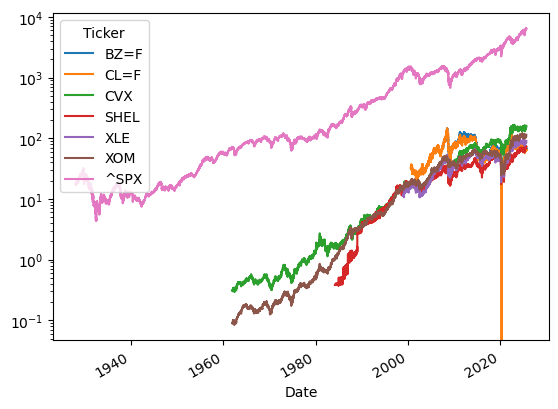

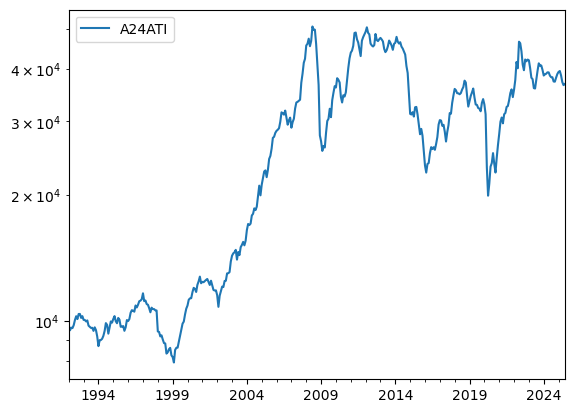

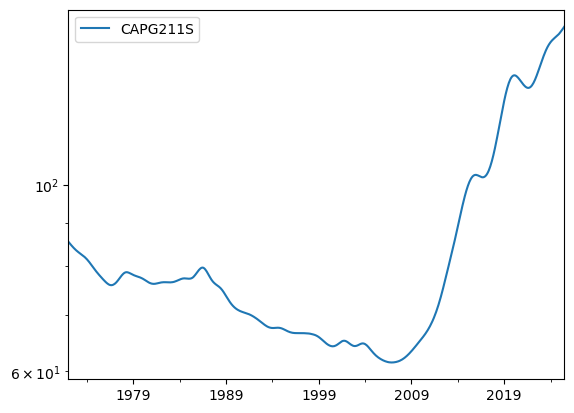

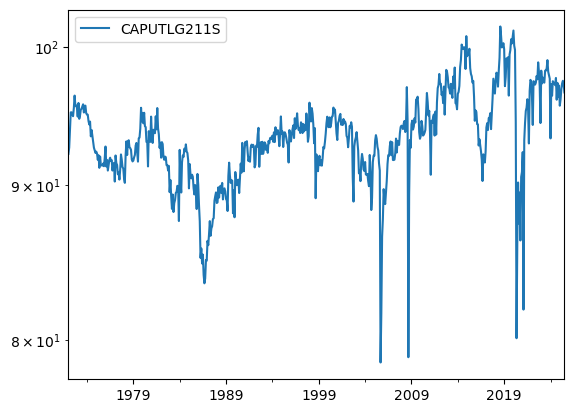

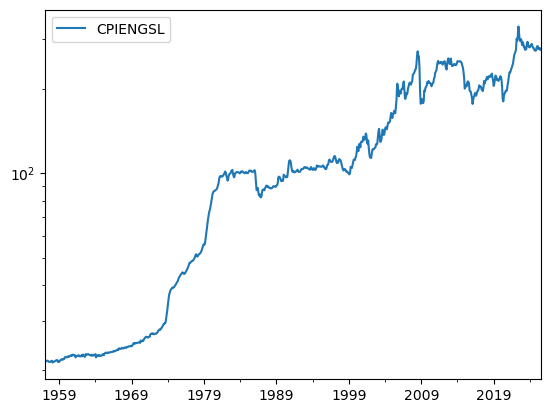

...

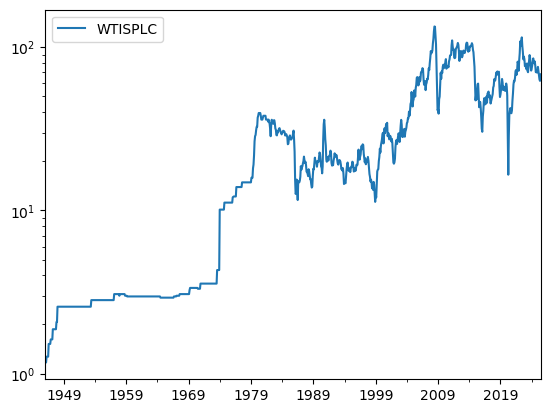

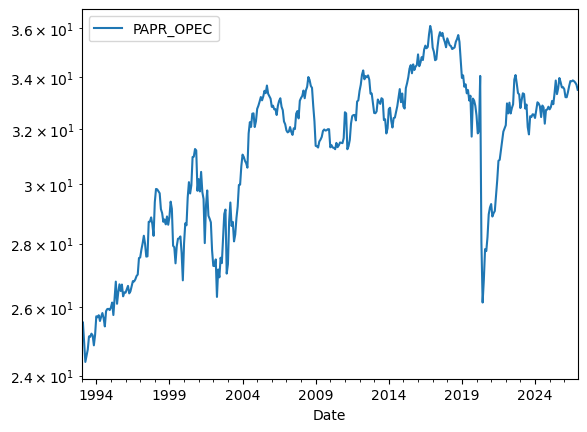

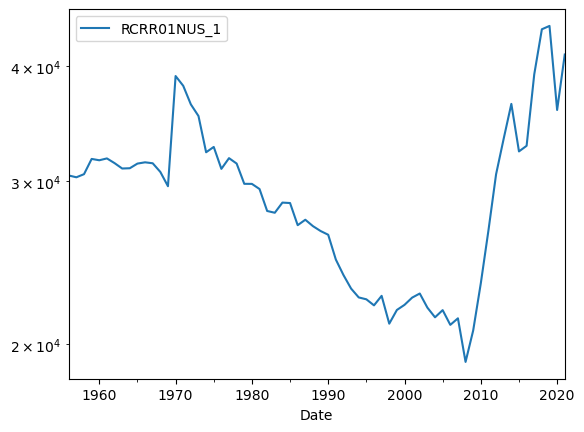

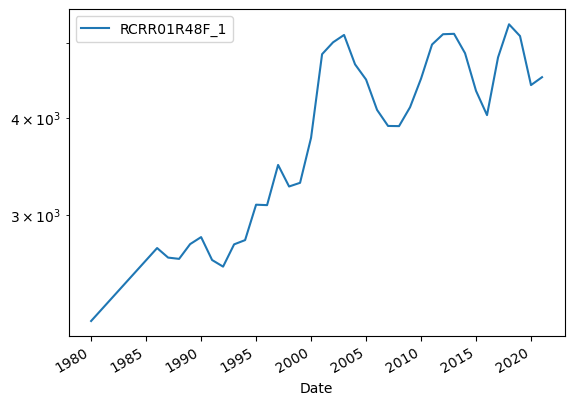

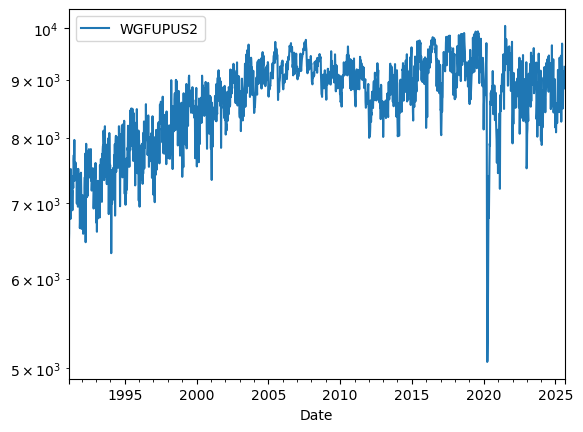

In [5]:
for d in datalist:
    d.plot()
    plt.yscale('log')
    plt.show()

## Clean/Transform data

In [6]:
def create_target_feature(
    df: pd.DataFrame, 
    target_feature: str,
    target_label: str,
    target_horizon_days: int
) -> pd.DataFrame:
    """Creates the target feature from the provided dataframe column."""
    res = pd.DataFrame()
    res[target_label] = df[target_feature].pct_change(periods=target_horizon_days, fill_method=None)
    return res

def merge_pct_changes_to_single_timeline(
    main_df: pd.DataFrame,
    datasets: list,
) -> pd.DataFrame:
    """Computes the percent change for all DataFrames in datasets, forward fills onto daily periods, 
    then merges onto the timeline provided by main_df.
    """
    for df in datasets:
        pc = df.pct_change(periods=1, fill_method=None).resample('D').ffill()
        main_df = main_df.join(pc, how='left')
    return main_df    

def remove_duplicate_indices(df: pd.DataFrame) -> pd.DataFrame:
    """If there are duplicated timestamp indices, remove the duplicates and keep only the first."""
    return df[~df.index.duplicated(keep='first')]

def handle_missing_values(df: pd.DataFrame) -> pd.DataFrame:
    """Forward fill missing values. This reflects the fact that, in a live trading environment, 
    we would have acesss to the most recently available data.
    """
    return df.ffill().dropna()

def handle_lagged_data_availability(
    df: pd.DataFrame, 
    ffl_df: pd.DataFrame=ffl_df, 
    target_label: str=TARGET_LABEL
) -> pd.DataFrame:
    """To account for EIA and FRED data becoming available weeks or months after the periods they 
    represent, we will offset these time series with a lag that estimates the delay between 
    occurence and measurement. We will use the feature-frequency-lag DataFrame (ffl_df) to do this.
    For the Yahoo Finance data, we will assume that trades take place during trading hours, meaning
    that closing prices are available up to and including the previous day. Accordingly, we will shift
    all Yahoo Finance data forward by one day to reflect this one-day lag.
    """
    freq_dict = {
        'annually': {'n_days': 365, 'kwarg': 'YS'},
        'monthly': {'n_days': 30, 'kwarg': 'MS'},
        'weekly': {'n_days': 7, 'kwarg': 'W'},
        'daily': {'n_days': 1, 'kwarg': 'D'},
    }
    for i in range(ffl_df.shape[0]):
        feature = ffl_df.iloc[i]['feature']
        freq = ffl_df.iloc[i]['frequency']
        lag = ffl_df.iloc[i]['lag [days]']
        if lag < 0:  # Forward-looking or current data becomes usable in the period after it is posted.
            n_shift = 1
        else:  # Backward-looking data may lag by multiple periods.
            n_days = freq_dict[freq]['n_days']
            n_shift = (lag // n_days) + 1
        df[feature] = df[feature].shift(periods=n_shift, freq=freq_dict[freq]['kwarg']).values
    for col in df.columns:
        if (col not in ffl_df['feature'].values) and (col != target_label):
            df[col] = df[col].shift(periods=1, freq='D').values
    return df

def handle_predicted_values(df: pd.DataFrame) -> pd.DataFrame:
    """Since the EIA Short Term Energy Outlook data includes forecasts, we must limit our data
    to timestamps up to the present day.
    """
    return df.loc[:TODAY]


clean_df = create_target_feature(
    df=yf_df, 
    target_feature=TARGET_FEATURE,
    target_label=TARGET_LABEL,
    target_horizon_days=TARGET_HORIZON_DAYS
)
clean_df = merge_pct_changes_to_single_timeline(
    main_df=clean_df,
    datasets=datalist,
)

preprocessing_pipeline = [
    remove_duplicate_indices,
    handle_missing_values,
    handle_lagged_data_availability,
    handle_predicted_values,
]
for func in preprocessing_pipeline:
    clean_df = func(clean_df)

clean_df

,target,BZ=F,CL=F,CVX,SHEL,XLE,XOM,^SPX,A24ATI,CAPG211S,...,IPG21112S,IPN213111N,INDPRO,OVXCLS,PCU211211,WTISPLC,PAPR_OPEC,RCRR01NUS_1,RCRR01R48F_1,WGFUPUS2
Date,,,,,,,,,,,,,,,,,,,,,
2007-07-31,0.063214,0.017296,0.017962,-0.013537,-0.004491,-0.009759,-0.010232,-0.012647,0.006102,0.000609,...,0.011302,0.001402,-0.001568,0.017573,-0.004799,0.099289,0.007753,0.016451,-0.046631,-0.002684
2007-08-01,0.008566,-0.022064,-0.021481,-0.001056,0.006765,-0.002608,0.008340,0.007243,0.005619,0.000706,...,-0.007582,0.002294,0.001961,-0.031281,-0.057493,-0.024130,-0.000850,0.016451,-0.046631,-0.002684
2007-08-02,0.025484,0.005441,0.004312,-0.015029,-0.011113,-0.006830,-0.007689,0.004359,0.005619,0.000706,...,-0.007582,0.002294,0.001961,-0.001682,-0.057493,-0.024130,-0.000850,0.016451,-0.046631,-0.002684
2007-08-03,-0.019995,-0.013332,-0.017955,-0.034212,-0.027571,-0.032625,-0.036393,-0.026586,0.005619,0.000706,...,-0.007582,0.002294,0.001961,-0.012129,-0.057493,-0.024130,-0.000850,0.016451,-0.046631,-0.009004
2007-08-06,-0.062085,-0.047893,-0.045310,0.012343,0.020290,0.005747,0.017787,0.024151,0.005619,0.000706,...,-0.007582,0.002294,0.001961,0.108117,-0.057493,-0.024130,-0.000850,0.016451,-0.046631,-0.009004
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-25,0.021760,0.015798,0.017908,0.000126,0.006819,0.002610,0.004134,-0.004266,-0.016920,0.003096,...,-0.003885,-0.022350,-0.001220,0.029325,-0.000772,0.003227,0.006747,-0.189088,-0.135802,0.045012
2025-08-26,0.014435,-0.022965,-0.023920,-0.005310,-0.002167,-0.001584,-0.002237,0.004134,-0.016920,0.003096,...,-0.003885,-0.022350,-0.001220,0.079706,-0.000772,0.003227,0.006747,-0.189088,-0.135802,0.045012
2025-08-27,0.014871,0.012348,0.014229,0.011947,0.000679,0.011221,0.011301,0.002391,-0.016920,0.003096,...,-0.003885,-0.022350,-0.001220,-0.053068,-0.000772,0.003227,0.006747,-0.189088,-0.135802,0.045012


If today is Fri 2025-08-15, then 'CL=F' represents the percent change at close of day yesterday (Wed 08-13 to Thurs 08-14) and 'target' represents the percent change over target_horizon_days starting from close of day yesterday (Thurs 08-14 to Thurs 08-21, assuming target_horizon_days = 5 trading days).

## Train/Val/Test Split

Since our data are all ordered by time, we will take contiguous segments as our training, validation, and test sets.

- Using our training set, we will derive estimates for our population distributions.
- Using our validation set, we will iteratively select well-performing models and try to improve their performance. Information from the validation set will leak into our model with each iteration/comparison, so we will try to limit the number of times we retrain our model after exposing it to the validation set. 
- The test set will be used exactly once on the final model. We will simulate a paper trading environment with walk-forward testing. The output will be either a "pass" or "fail" indication for our final model.

In [7]:
val_start_date = '2019-01-01'
test_start_date = '2023-01-01'

train_df = clean_df.loc[:val_start_date]
val_df = clean_df.loc[val_start_date:test_start_date]
test_df = clean_df.loc[test_start_date:]

print(f"Train Set:  {train_df.index[0].date()} to {train_df.index[-1].date()}  =  {train_df.shape[0]} pts")
print(f"Val Set:  {val_df.index[0].date()} to {val_df.index[-1].date()}  =  {val_df.shape[0]} pts")
print(f"Test Set:  {test_df.index[0].date()} to {test_df.index[-1].date()}  =  {test_df.shape[0]} pts")

Train Set:  2007-07-31 to 2018-12-31  =  2876 pts
Val Set:  2019-01-02 to 2022-12-30  =  1008 pts
Test Set:  2023-01-03 to 2025-08-29  =  670 pts


# EDA on Entire Training Set

In [8]:
train_df.describe()

,target,BZ=F,CL=F,CVX,SHEL,XLE,XOM,^SPX,A24ATI,CAPG211S,...,IPG21112S,IPN213111N,INDPRO,OVXCLS,PCU211211,WTISPLC,PAPR_OPEC,RCRR01NUS_1,RCRR01R48F_1,WGFUPUS2
count,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,...,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000,2876.000000
mean,0.000417,-0.000042,0.000095,0.000368,0.000280,0.000187,0.000150,0.000265,0.000738,0.005153,...,0.006730,0.000706,0.000214,-0.000493,-0.000279,0.001387,0.000699,0.069959,0.028341,0.000435
std,0.051489,0.021694,0.024227,0.016976,0.017733,0.018334,0.015305,0.012677,0.048454,0.003589,...,0.029525,0.045055,0.007414,0.048156,0.077147,0.090713,0.010367,0.094029,0.083890,0.030794
min,-0.268150,-0.103678,-0.122478,-0.124891,-0.109153,-0.144438,-0.139525,-0.090350,-0.242779,-0.001102,...,-0.211945,-0.161877,-0.043858,-0.355903,-0.261930,-0.285864,-0.040988,-0.111777,-0.106001,-0.131559
25%,-0.028066,-0.009925,-0.012069,-0.007334,-0.007877,-0.007667,-0.006745,-0.004133,-0.024703,0.002358,...,-0.003349,-0.006101,-0.003167,-0.026619,-0.043444,-0.048744,-0.004157,0.014079,-0.056064,-0.015789
50%,0.001460,0.000000,0.000361,0.000790,0.000732,0.000421,0.000107,0.000551,0.002281,0.004622,...,0.006583,0.009664,0.000948,-0.004155,0.005804,0.010286,0.001246,0.093092,0.031150,0.000771
75%,0.028617,0.009923,0.011936,0.008396,0.008710,0.008732,0.007141,0.005588,0.033087,0.008702,...,0.015732,0.028496,0.004087,0.020883,0.049359,0.058236,0.006642,0.140843,0.103571,0.017764
max,0.312712,0.135492,0.178329,0.208542,0.170246,0.164746,0.171905,0.115800,0.098569,0.011352,...,0.185923,0.068748,0.013715,0.387892,0.198767,0.238456,0.030648,0.194886,0.187454,0.100602


In [9]:
train_df.cov()

,target,BZ=F,CL=F,CVX,SHEL,XLE,XOM,^SPX,A24ATI,CAPG211S,...,IPG21112S,IPN213111N,INDPRO,OVXCLS,PCU211211,WTISPLC,PAPR_OPEC,RCRR01NUS_1,RCRR01R48F_1,WGFUPUS2
target,0.002651,4.717507e-04,5.595423e-04,1.834424e-04,2.089254e-04,2.293721e-04,1.405492e-04,9.506106e-05,0.000792,-8.780472e-06,...,-1.273431e-04,-1.978923e-04,-4.516331e-06,-3.493952e-04,0.001078,0.001821,2.464109e-05,0.000282,1.601542e-04,-3.337981e-05
BZ=F,0.000472,4.706469e-04,4.462481e-04,1.805699e-04,1.902810e-04,2.209144e-04,1.420517e-04,9.254314e-05,0.000137,-8.593765e-07,...,-2.769379e-05,-2.397269e-05,2.299527e-06,-3.267970e-04,0.000174,0.000285,5.670150e-06,0.000077,3.863152e-05,-4.857169e-07
CL=F,0.000560,4.462481e-04,5.869451e-04,2.056517e-04,2.158776e-04,2.512506e-04,1.646145e-04,1.027749e-04,0.000133,-1.665432e-06,...,-2.021513e-05,-3.560550e-05,5.771922e-08,-3.799439e-04,0.000158,0.000284,5.911722e-06,0.000045,2.961294e-05,-2.631651e-07
CVX,0.000183,1.805699e-04,2.056517e-04,2.881762e-04,2.382981e-04,2.797458e-04,2.242449e-04,1.679803e-04,0.000044,-6.227955e-07,...,-5.713878e-07,-1.454453e-08,7.026528e-07,-2.414097e-04,0.000029,0.000080,2.567428e-07,0.000020,8.936382e-06,-1.560787e-06
SHEL,0.000209,1.902810e-04,2.158776e-04,2.382981e-04,3.144459e-04,2.651361e-04,2.055231e-04,1.631255e-04,0.000049,-1.403219e-07,...,1.150562e-05,1.387317e-06,3.184138e-06,-2.440654e-04,0.000050,0.000090,2.123051e-06,0.000047,2.726461e-05,-6.158850e-06
XLE,0.000229,2.209144e-04,2.512506e-04,2.797458e-04,2.651361e-04,3.361181e-04,2.432870e-04,1.925358e-04,0.000064,-3.601208e-07,...,4.849901e-07,-4.310828e-06,1.649752e-06,-2.983444e-04,0.000052,0.000108,2.257580e-06,0.000031,4.288031e-06,-6.769682e-06
XOM,0.000141,1.420517e-04,1.646145e-04,2.242449e-04,2.055231e-04,2.432870e-04,2.342309e-04,1.505164e-04,0.000029,-2.559454e-07,...,-6.454683e-07,-2.057741e-06,-3.868655e-07,-2.101231e-04,0.000013,0.000046,2.220419e-06,0.000007,-3.238685e-06,-8.450359e-06
^SPX,0.000095,9.254314e-05,1.027749e-04,1.679803e-04,1.631255e-04,1.925358e-04,1.505164e-04,1.607180e-04,0.000036,5.056573e-07,...,-4.070227e-06,-2.723681e-07,1.327386e-06,-1.917032e-04,0.000038,0.000066,2.298729e-06,0.000040,9.361090e-06,-4.873849e-06
A24ATI,0.000792,1.370151e-04,1.327316e-04,4.406614e-05,4.912041e-05,6.360056e-05,2.929900e-05,3.590357e-05,0.002348,-1.388475e-05,...,-9.034039e-05,2.391538e-04,8.344861e-05,-1.399442e-04,0.002309,0.003222,9.894535e-05,0.000937,6.640060e-04,-3.021711e-05
CAPG211S,-0.000009,-8.593765e-07,-1.665432e-06,-6.227955e-07,-1.403219e-07,-3.601208e-07,-2.559454e-07,5.056573e-07,-0.000014,1.287966e-05,...,2.094830e-05,2.786816e-05,5.885995e-06,2.658807e-06,-0.000016,-0.000029,-2.114511e-06,0.000164,7.641943e-05,5.297885e-07


Even though our covariances span multiple orders of magnitude, we will not normalize our data (beyond computing the percent change, which we already did) because the values are semantically meaningful: negative values reflect real-world declines in price, inventory, output, etcetera. Also, since the percent change of our economic data does not represent true returns in the financial sense, we will not de-annualize any of our data. Instead, we will require our models to handle the various orders of magnitude as they are.

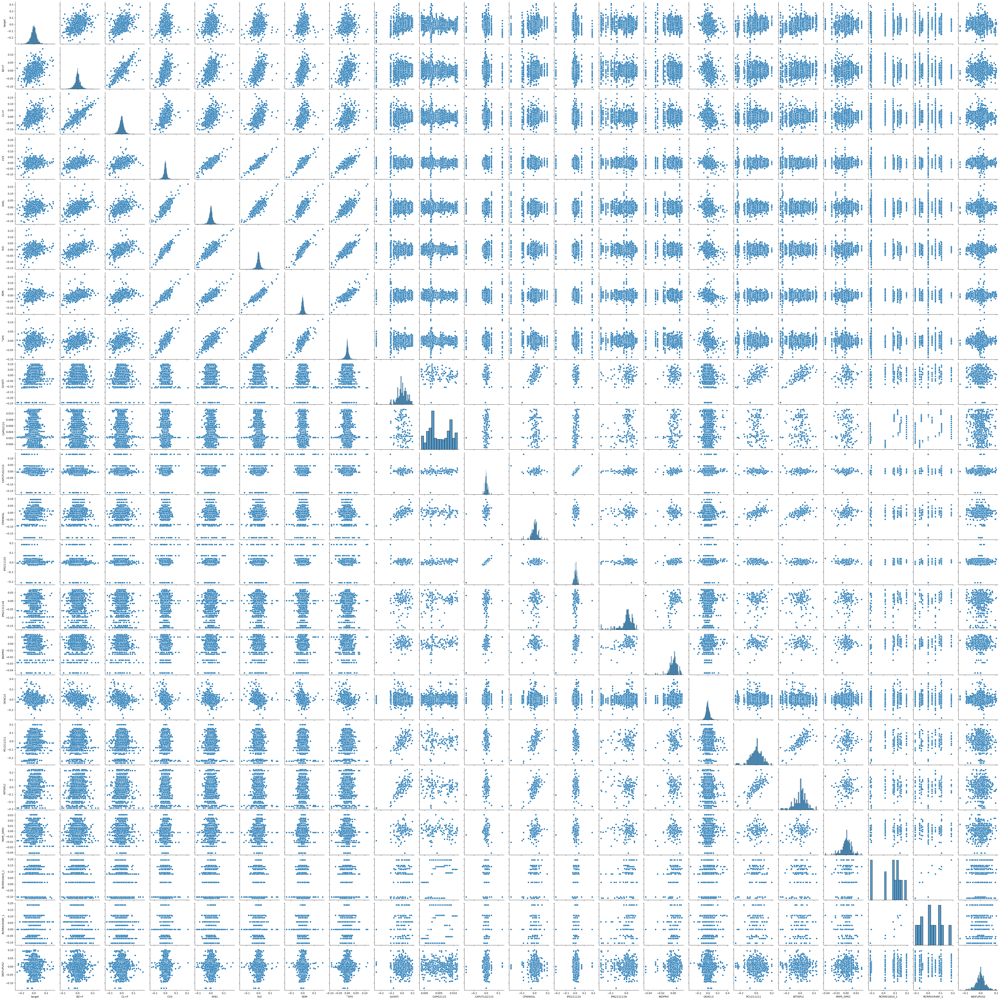

In [10]:
sns.pairplot(train_df)
plt.show()

Changes in proved oil reserves appear to take on a small set of discrete values, while the stock prices tend to have more continuously distributed price changes.

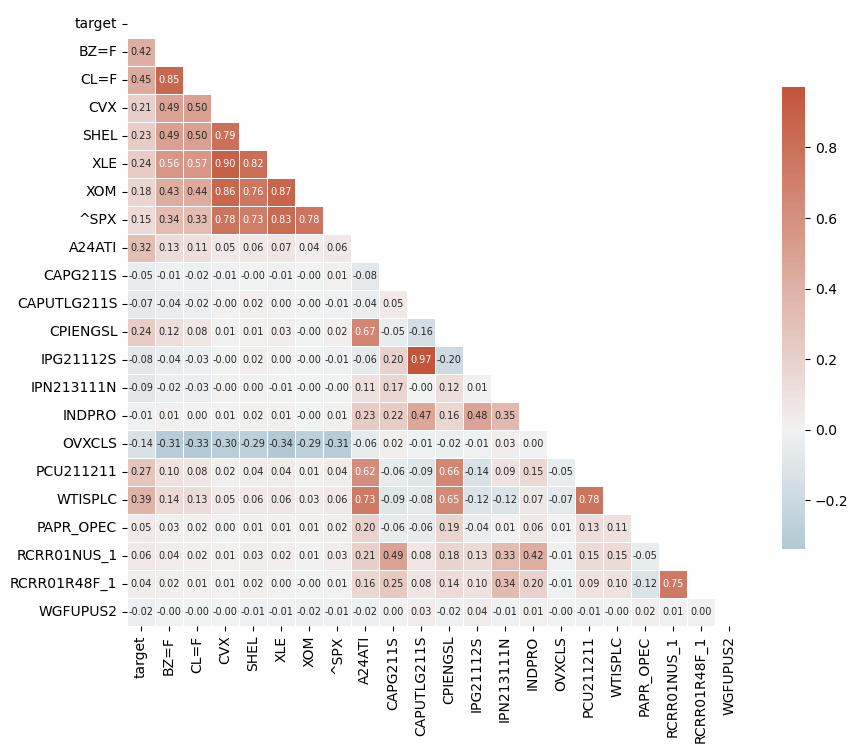

In [11]:
corr = train_df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

fig, ax = plt.subplots(1, 1, figsize=(10, 8))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(
    corr, mask=mask, cmap=cmap, center=0, annot=True,
    fmt="0.2f", annot_kws={"size": 7}, square=True, linewidths=.5, 
    cbar_kws={"shrink": .75}, ax=ax
)
plt.show()

As expected, the stocks CVX and SHEL, along with the sector ETFs XLE and XOM all exhibit strong correlation with the general market index ^SPX, but more moderate correlation with oil futures BZ=F and CL=F. Meanwhile, the futures have strong correlation with each other. Oil/gas capacity utilization (CAPUTLG211S) and oil production (IPG21112S) are almost perfectly correlated, suggesting that we should examine the possbility of dropping one of them.

## Closer Look: Utilization and Production

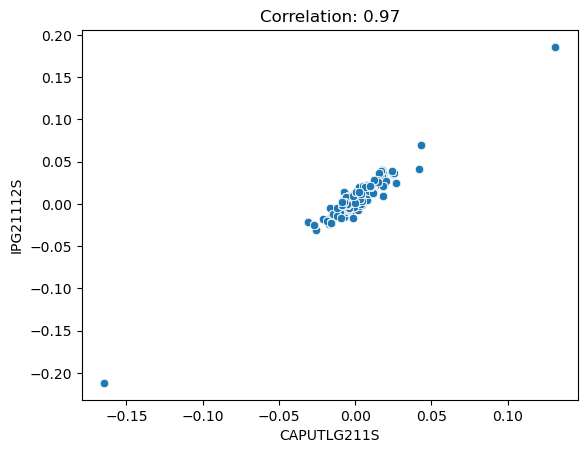

In [12]:
utilization_label = 'CAPUTLG211S'
production_label = 'IPG21112S'

corr = train_df[[utilization_label, production_label]].corr()
plt.title(f"Correlation: {corr.loc[utilization_label, production_label]:.2f}")
sns.scatterplot(train_df, x=utilization_label, y=production_label)
plt.show()

Let's remove the lower and upper extrema and replot:

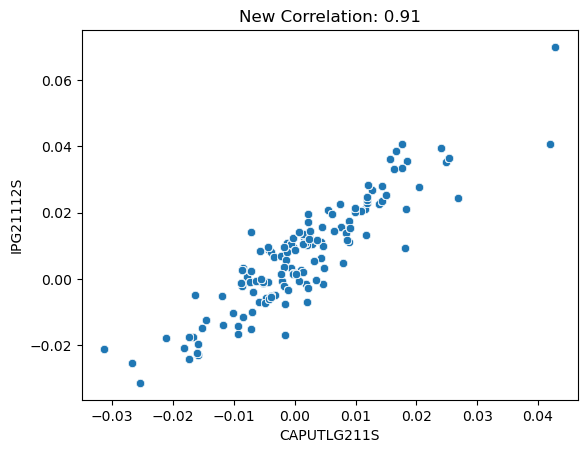

In [13]:
cond1 = (train_df[utilization_label] != train_df[utilization_label].max())
cond2 = (train_df[utilization_label] != train_df[utilization_label].min())

corr = train_df[cond1 & cond2][[utilization_label, production_label]].corr()
plt.title(f"New Correlation: {corr.loc[utilization_label, production_label]:.2f}")
sns.scatterplot(train_df[cond1 & cond2], x=utilization_label, y=production_label)
plt.show()

Removing the upper/lower extrema reduces the correlation from 0.97 down to 0.90 -- which is still strong. When did these extrema occur?

In [14]:
train_df[~cond1].index, train_df[~cond2].index

(DatetimeIndex(['2008-10-01', '2008-10-02', '2008-10-03', '2008-10-06',
                '2008-10-07', '2008-10-08', '2008-10-09', '2008-10-10',
                '2008-10-13', '2008-10-14', '2008-10-15', '2008-10-16',
                '2008-10-17', '2008-10-20', '2008-10-21', '2008-10-22',
                '2008-10-23', '2008-10-24', '2008-10-27', '2008-10-28',
                '2008-10-29', '2008-10-30', '2008-10-31'],
               dtype='datetime64[ns]', name='Date', freq=None),
 DatetimeIndex(['2008-09-02', '2008-09-03', '2008-09-04', '2008-09-05',
                '2008-09-08', '2008-09-09', '2008-09-10', '2008-09-11',
                '2008-09-12', '2008-09-15', '2008-09-16', '2008-09-17',
                '2008-09-18', '2008-09-19', '2008-09-22', '2008-09-23',
                '2008-09-24', '2008-09-25', '2008-09-26', '2008-09-29',
                '2008-09-30'],
               dtype='datetime64[ns]', name='Date', freq=None))

These extreme values appeared during the two worst months of the 2008 market crash. Those were extraordinary times, so this economic data appears to be a realistic and fair representation of what happened. For that reason, we will not remove these outliers from the data. Since the capacity utilization (CAPUTLG211S) also reflects natural gas, it does technicaly introduce additional data not visible in oil production (IPG21112S), which is likely the reason for the less-than perfect correlation. We could probably drop one of these series without trouble, but on the off-chance the non-mutual information is useful, we will keep them both and let the model decide which one is more important.

## Combinatorial Purged Cross Validation

To improve our model development process and avoid overfitting our validation set, we will use combinatorial cross validation within our training set. To make sure our process is capable of predicting out-of-sample market dynamics for multiple years at a time, we will aim for segments of roughly 1 year each. Our training set spans 11.5 years, so we will divide it into 11 segments and pick 8 for training, with the remaining 3 for cross-validation. In every iteration, the model development process will train a model on ~8 years of data and predicting on the unseen 3 years. This arrangement will give us $\binom{11}{8}=165$ combinations, which is certainly enough to estimate the first and second statistical moments of our performance metrics.

In [15]:
class CPCV:
    def __init__(
        self, 
        train_df: pd.DataFrame,
        n_segments: int=8,
        k_choose: int=6,
        purge_horizon: int=1,
        show: bool=False
    ) -> None:
        self.train_df = train_df
        self.n_segments = n_segments
        self.k_choose = k_choose
        self.purge_horizon = purge_horizon

        # Split training set into n_groups of roughly equal size
        self.n_train = train_df.shape[0]
        dn = self.n_train // self.n_segments
        x = [dn * i for i in range(self.n_segments + 1)]
        x[-1] = self.n_train

        # Create index slices for each segment
        self.segments = [np.arange(a, b, dtype=int) for a, b in zip(x[:-1], x[1:])]
        
        # Create groups comprised of various combinations of segments
        self.groups = list(itertools.combinations(self.segments, self.k_choose))
        self.n_groups = len(self.groups)
        
        group_idxs = [np.r_[group] for group in self.groups]
        print(f"{len(group_idxs)} CPCV sets")
        if show:
            display(group_idxs)

    def get_group_idxs(self, combo_idx: int) -> dict:
        """For a given combo_idx, returns the generated indices for the cpcv_train, 
        cpcv_val, and purged sets. These indices can be used to slice out the desired
        data from self.train_df.
        """
        # Get values in ar1 that are not in ar2; that is, get idxs that are not in 
        # train and use them in val.
        ar1 = np.arange(self.n_train, dtype=np.int64)
        ar2 = np.r_[self.groups[combo_idx]]
        val_idxs = np.setdiff1d(ar1=ar1, ar2=ar2)

        # Now purge last purge_horizon indices from each train segment
        train_idxs_seperated = [x[:-self.purge_horizon] for x in self.groups[combo_idx]]
        train_idxs = np.r_[tuple(train_idxs_seperated)]

        # Keep track of the purged indices for verification
        purged_idxs_seperated = [x[-self.purge_horizon:] for x in self.groups[combo_idx]]
        purged_idxs = np.r_[tuple(purged_idxs_seperated)]
        
        result = {
            'cpcv_train_idxs': train_idxs, 
            'cpcv_val_idxs': val_idxs, 
            'purged_idxs': purged_idxs
        }
        return result

    def get_cpcv_sets(self, combo_idx: int) -> (pd.DataFrame, pd.DataFrame):
        """Returns both the CPCV training, validation, and purged set data (not indices), 
        checking that the total number of elements matches the expected length.
        """
        group_idxs = self.get_group_idxs(combo_idx=combo_idx)
        cpcv_train = self.train_df.iloc[group_idxs['cpcv_train_idxs']]
        cpcv_val = self.train_df.iloc[group_idxs['cpcv_val_idxs']]
        cpcv_purged = self.train_df.iloc[group_idxs['purged_idxs']]
        
        assert cpcv_val.shape[0] + cpcv_train.shape[0] + cpcv_purged.shape[0] == self.train_df.shape[0]
        result = {
            'cpcv_train': cpcv_train,
            'cpcv_val': cpcv_val,
            'cpcv_purged': cpcv_purged,
        }
        return result

cpcv = CPCV(train_df=train_df, n_segments=11, k_choose=8, purge_horizon=TARGET_HORIZON_DAYS, show=True)
print()

i = 0
cpcv_idxs = cpcv.get_group_idxs(combo_idx=i)
cpcv_data = cpcv.get_cpcv_sets(combo_idx=i)
cpcv_train = cpcv_data['cpcv_train']
cpcv_val = cpcv_data['cpcv_val']
print(f"CPCV Train shape for i={i}: {cpcv_train.shape}")
print(f"CPCV Val shape for i={i}: {cpcv_val.shape}")
print(f"CPCV Purged shape for i={i}: {cpcv_data['cpcv_purged'].shape}")

165 CPCV sets


[array([   0,    1,    2, ..., 2085, 2086, 2087], shape=(2088,)),
 array([   0,    1,    2, ..., 2346, 2347, 2348], shape=(2088,)),
 array([   0,    1,    2, ..., 2607, 2608, 2609], shape=(2088,)),
 array([   0,    1,    2, ..., 2873, 2874, 2875], shape=(2093,)),
 array([   0,    1,    2, ..., 2346, 2347, 2348], shape=(2088,)),
 array([   0,    1,    2, ..., 2607, 2608, 2609], shape=(2088,)),
 array([   0,    1,    2, ..., 2873, 2874, 2875], shape=(2093,)),
 array([   0,    1,    2, ..., 2607, 2608, 2609], shape=(2088,)),
 array([   0,    1,    2, ..., 2873, 2874, 2875], shape=(2093,)),
 array([   0,    1,    2, ..., 2873, 2874, 2875], shape=(2093,)),
 array([   0,    1,    2, ..., 2346, 2347, 2348], shape=(2088,)),
 array([   0,    1,    2, ..., 2607, 2608, 2609], shape=(2088,)),
 array([   0,    1,    2, ..., 2873, 2874, 2875], shape=(2093,)),
 array([   0,    1,    2, ..., 2607, 2608, 2609], shape=(2088,)),
 array([   0,    1,    2, ..., 2873, 2874, 2875], shape=(2093,)),
 array([  


CPCV Train shape for i=0: (2048, 22)
CPCV Val shape for i=0: (788, 22)
CPCV Purged shape for i=0: (40, 22)


Note that each element will occur in $\binom{n - 1}{k - 1}$ of the combinations, so we would expect to see the first segment appear in 21 out of 28 combinations given n_groups=8 and k_choose=6.

# Single Model Development

## Discretize Data

In [16]:
class SimpleDiscretizer:
    """Discretizes data by sign. 0 means negative, 1 means positive.
    This class exists for the sake of consistency: we may want to 
    use more complicated discretizers in the future, but with similar
    usage patterns.
    """
    def __init__(self) -> None:
        pass

    def fit(self, df: pd.DataFrame) -> None:
        pass
        
    def transform(self, df: pd.DataFrame) -> pd.DataFrame:
        """Applies the sign-based discretization."""
        return (df > 0) * 1


class QuantileDiscretizer:
    """Discretizes data to quantiles labeled by integer bin numbers."""
    def __init__(
        self, 
        quantiles: np.ndarray | list=[0., 0.2, 0.4, 0.6, 0.8, 1.],
    ) -> None:
        self.quantiles = quantiles
        self.models = {}
        self.labels = {}

    def fit(self, df: pd.DataFrame) -> None:
        """Determines quantile values for each feature in df. Stores 
        theses quantiles as model parameters for each respective
        feature.
        """
        for feature in df.columns:
            q = np.unique(
                np.quantile(df[feature], q=self.quantiles)
            )
            q[0] = -np.inf  # Set lower boundary to -infinity
            q[-1] = np.inf  # Set upper boundary to +infinity
            self.models[feature] = q
            self.labels[feature] = np.arange(len(q)-1)
            

    def transform(self, df: pd.DataFrame) -> pd.DataFrame:
        """Uses stored model parameters (quantiles fit by the self.fit() 
        method) for each feature to transform df, applying integer labels 
        for each bin.
        """
        data = {}
        for feature in df.columns:
            data[feature] = pd.cut(
                df[feature], 
                bins=self.models[feature],
                labels=self.labels[feature]
            ).astype(int).values
        return pd.DataFrame(data).set_index(df.index)


class MixedDiscretizer:
    def __init__(
        self,
        simple_labels: list,
        quantile_labels: list,
        exclude_labels: list,
        quantiles: np.ndarray | list=[0., 0.2, 0.4, 0.6, 0.8, 1.],
    ) -> None:
        self.simple_labels = simple_labels
        self.quantile_labels = quantile_labels
        self.exclude_labels = exclude_labels
        self.quantiles = quantiles
        self.sd = SimpleDiscretizer()
        self.qd = QuantileDiscretizer(quantiles=self.quantiles)

    def fit(self, df: pd.DataFrame) -> None:
        self.sd.fit(df[self.simple_labels])
        self.qd.fit(df[self.quantile_labels])

    def transform(self, df: pd.DataFrame) -> pd.DataFrame:
        res = pd.concat(
            [
                df[self.exclude_labels],
                self.sd.transform(df[self.simple_labels]),
                self.qd.transform(df[self.quantile_labels]),
            ],
            axis=1
        )
        return res

        
##########################################################################################
### Example: fit discretizer to training set, use model to transform validation set
##########################################################################################
discretizer = SimpleDiscretizer()
# discretizer = QuantileDiscretizer(quantiles=np.linspace(0., 1., 6))
# simple_labels = ['target']
# exclude_labels = []
# quantile_labels = [feature for feature in cpcv_train.columns if feature not in (simple_labels + exclude_labels)]
# discretizer = MixedDiscretizer(
#     simple_labels=simple_labels,
#     quantile_labels=quantile_labels,
#     exclude_labels=exclude_labels,
#     quantiles=np.linspace(0., 1., 11)
# )

discretizer.fit(cpcv_train)
cpcv_train_discrete = discretizer.transform(cpcv_train)
cpcv_val_discrete = discretizer.transform(cpcv_val)

cpcv_val_discrete

,target,BZ=F,CL=F,CVX,SHEL,XLE,XOM,^SPX,A24ATI,CAPG211S,...,IPG21112S,IPN213111N,INDPRO,OVXCLS,PCU211211,WTISPLC,PAPR_OPEC,RCRR01NUS_1,RCRR01R48F_1,WGFUPUS2
Date,,,,,,,,,,,,,,,,,,,,,
2015-11-12,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,1,0,0,1
2015-11-13,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0,1,0,0,0
2015-11-16,0,0,1,1,1,1,1,1,0,1,...,0,0,0,1,0,0,1,0,0,0
2015-11-17,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
2015-11-18,0,1,1,1,1,1,1,1,0,1,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,0,0,0,0,0,0,0,0,0,1,...,1,1,1,1,1,0,0,1,1,1
2018-12-26,0,1,1,1,1,1,1,1,0,1,...,1,1,1,1,1,0,0,1,1,1
2018-12-27,0,0,0,1,1,1,1,1,0,1,...,1,1,1,1,1,0,0,1,1,1


## Encoding Market Regimes

Labeling market regimes is challenging because there is no single "right answer." Our goal is train an HMM that can identify when markets are generally trending upward, downard, or sideways, under the hypothesis that such information can be used to predict price movements in the near future. We don't have to be perfectly accurate; we just need enough of a statistical edge to build a profitable trading strategy. 

We will initialize the HMM under the assumption that there are three market regimes (the HMM's "hidden states"): bulls, bears, and stagnant markets. We will assume that each market emits a different proportion of positive/negative price movements. More specifically, we will start with the assumption that bull markets are more likely to emit positive price movements than negative movements, and vice versa for bear markets; for stagnant markets, we will assume equal probabilities of positive and negative price movements.

In [17]:
class HMMEncoder:
    def __init__(
        self, 
        allowed_features: list,
        hidden_state_emission_priors: list,
        transition_priors: list,
        start_priors: list,
        max_iter: int=100,
    ) -> None:
        self.allowed_features = allowed_features
        self.hidden_state_emission_priors = hidden_state_emission_priors
        self.transition_priors = transition_priors
        self.start_priors = start_priors
        self.max_iter = max_iter
        self.models = {}

    def expand_priors(self, prior_list: list, series: pd.Series) -> list:
        """Expands a priors array of size N to an array of size M, where M > N and M % N == 0.
        Each of the N segments of M adds up to their corresponding value from N, and the sum of M
        equals the sum of N. This makes it easier to handle configurations where some columns are 
        discretized by quantile and others aren't.
        """
        new_prior_list = []
        for prior_object in prior_list:
            priors = prior_object.probs[0].numpy()
            n_priors = len(priors)
            n_unique = len(series.unique())
            
            if n_unique == n_priors:
                new_prior_list.append(prior_object)
            else:
                assert n_unique % n_priors == 0
                n_per_segment = int(n_unique / n_priors)
                new_priors = []
                for i in range(n_priors):
                    val = priors[i] / n_per_segment
                    new_priors = new_priors + [val] * n_per_segment
                new_prior_list.append(Categorical([new_priors]))
                
        return new_prior_list
        
    def fit(
        self, 
        df: pd.DataFrame,
        verbose: int=0
    ) -> None:
        for feature in df.columns:
            if feature in self.allowed_features:
                verb = False
                if verbose > 0:
                    print(f"Fitting {feature}...")
                    if verbose == 2:
                        verb = True
                        
                expanded_emission_priors = self.expand_priors(
                    prior_list=self.hidden_state_emission_priors,
                    series=df[feature]
                )
                self.models[feature] = DenseHMM(
                    expanded_emission_priors, 
                    edges=self.transition_priors, 
                    starts=self.start_priors, 
                    verbose=verb,
                    max_iter=self.max_iter
                )
                X = df[feature].values.reshape(1, -1, 1)
                self.models[feature].fit(X)
                
    def encode(
        self,
        df: pd.DataFrame
    ) -> pd.DataFrame:
        data = {}
        for feature in df.columns:
            if feature in self.allowed_features:  # Encode feature as market regime
                X = df[feature].values.reshape(1, -1, 1)
                pred = np.argmax(self.models[feature].predict_proba(X).numpy()[0], axis=1)
                data[feature] = pred
            else:  # Use feature as-is
                data[feature] = df[feature]
        return pd.DataFrame(data)
        

##########################################################################################
### Example: fit regime detector to training set, use model to transform validation set
##########################################################################################
# Prior distributions for emissions
hs_bear = Categorical([[0.6, 0.4]])
hs_stag = Categorical([[0.5, 0.5]])
hs_bull = Categorical([[0.4, 0.6]])
hidden_states = [hs_bear, hs_stag, hs_bull]

# Prior distributions for HS transitions
edges = [
    [0.90, 0.05, 0.05],
    [0.05, 0.90, 0.05],
    [0.05, 0.05, 0.90]
]

# Prior distributions for starting state
starts = [0.3, 0.3, 0.4]

features_to_encode = yf_features  
hmm = HMMEncoder(
    allowed_features=features_to_encode,
    hidden_state_emission_priors=hidden_states,
    transition_priors=edges,
    start_priors=starts,
)
hmm.fit(cpcv_train_discrete, verbose=1)
cpcv_train_encoded = hmm.encode(cpcv_train_discrete)
cpcv_val_encoded = hmm.encode(cpcv_val_discrete)
cpcv_val_encoded

Fitting BZ=F...
Fitting CL=F...
Fitting CVX...
Fitting SHEL...
Fitting XLE...
Fitting XOM...
Fitting ^SPX...


,target,BZ=F,CL=F,CVX,SHEL,XLE,XOM,^SPX,A24ATI,CAPG211S,...,IPG21112S,IPN213111N,INDPRO,OVXCLS,PCU211211,WTISPLC,PAPR_OPEC,RCRR01NUS_1,RCRR01R48F_1,WGFUPUS2
Date,,,,,,,,,,,,,,,,,,,,,
2015-11-12,0,0,0,0,0,0,0,2,0,1,...,0,0,0,1,0,0,1,0,0,1
2015-11-13,0,0,0,0,0,0,0,2,0,1,...,0,0,0,1,0,0,1,0,0,0
2015-11-16,0,0,0,0,0,0,0,2,0,1,...,0,0,0,1,0,0,1,0,0,0
2015-11-17,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
2015-11-18,0,0,0,0,0,0,0,2,0,1,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,0,0,0,0,0,0,0,0,0,1,...,1,1,1,1,1,0,0,1,1,1
2018-12-26,0,0,0,0,1,0,0,0,0,1,...,1,1,1,1,1,0,0,1,1,1
2018-12-27,0,0,0,1,1,0,0,0,0,1,...,1,1,1,1,1,0,0,1,1,1


### Visualize HMM Regime Encodings

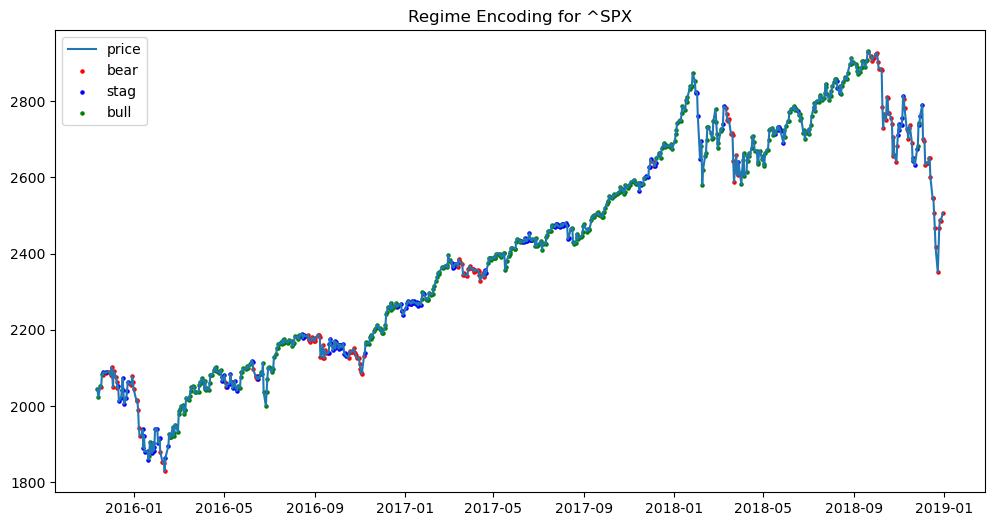

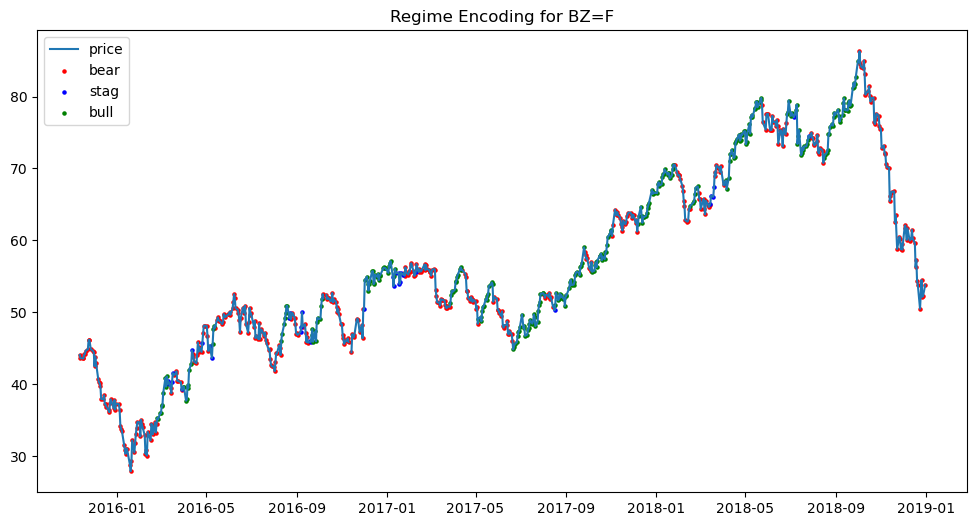

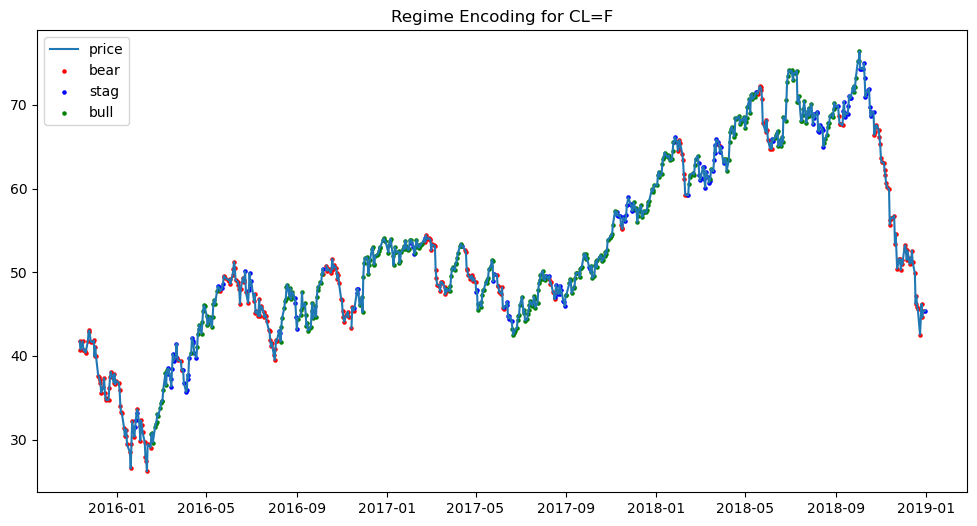

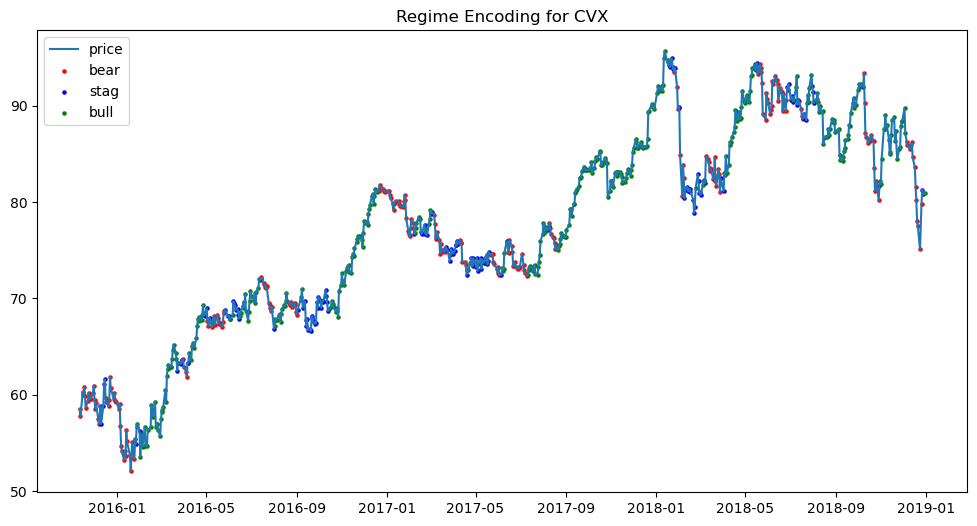

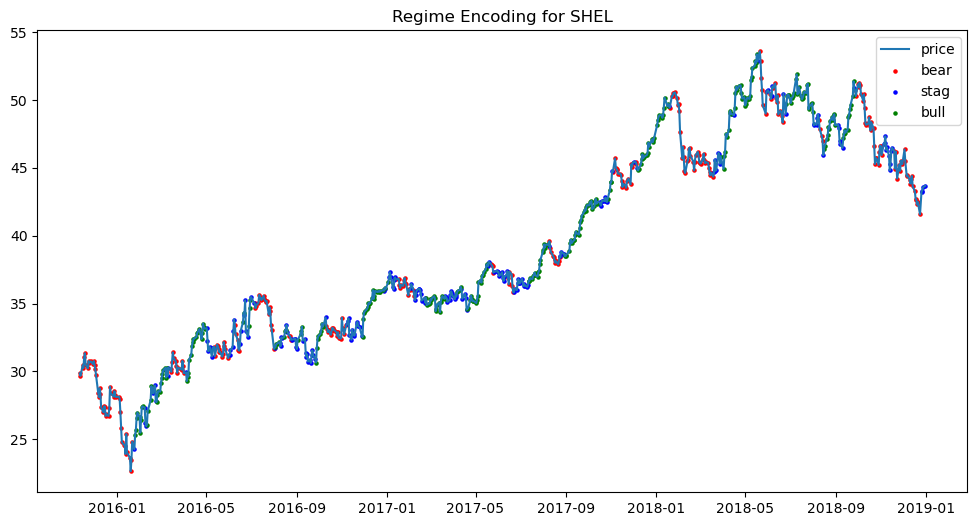

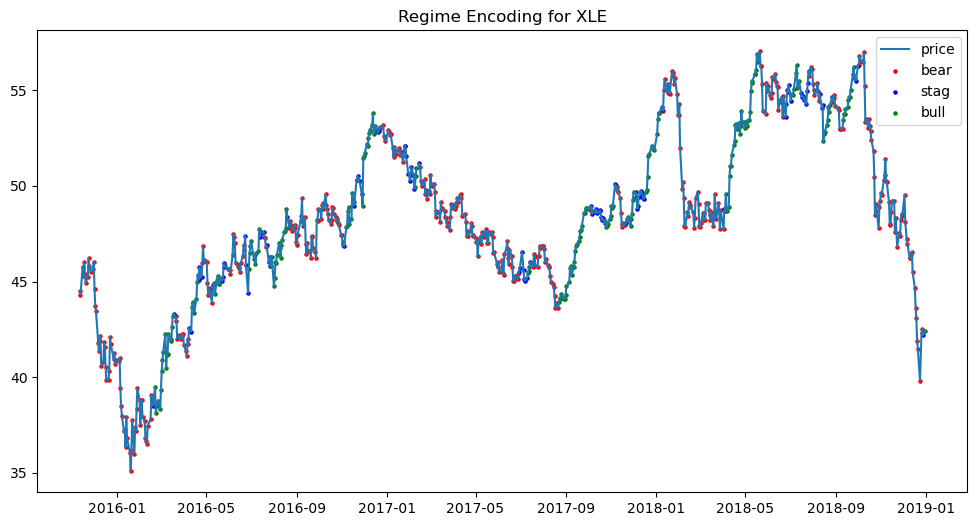

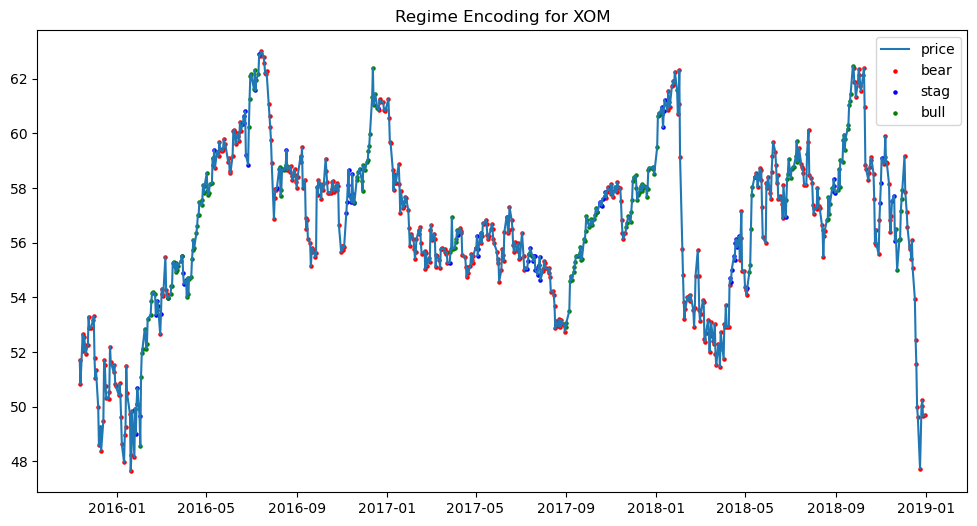

In [18]:
dataset = cpcv_val_encoded
dt_idxs = dataset.index

for feature in features_to_encode:
    price_data = yf_df.loc[dt_idxs, feature]
    
    c_dict = {0: 'red', 1: 'blue', 2: 'green'}
    hs_dict = {0: 'bear', 1: 'stag', 2: 'bull'}
    
    plt.figure(figsize=(12, 6))
    plt.plot(price_data, label='price')
    for val in c_dict.keys():
        x = dataset[dataset[feature]==val][feature].index
        y = price_data.loc[x]
        plt.scatter(x, y, c=c_dict[val], s=5, label=hs_dict[val])
    plt.title(f"Regime Encoding for {feature}")
    plt.legend()
    plt.show()

The HMM regime-encoding process is more of an art than a science, as we can see from some of the questionable regime labels applied in the graphs above. Even so, if the HMM is able to represent trends better than the day-to-day price changes, that information could potentially be enough to predict WIT price movements with a statistical edge.

## Structure-Fitting

In [19]:
def verify_all_nodes_connected_to_graph(model):
    connected_nodes = set([str(s) for s in np.array(model.edges).flatten()])
    disconnected_nodes = []
    for feature in list(model.nodes):
        if feature not in connected_nodes:
            disconnected_nodes.append(feature)

    if len(disconnected_nodes) != 0:
        warnings.warn(f"Disconnected nodes: {disconnected_nodes}")


def enforce_states_are_represented(
    model: DiscreteBayesianNetwork,
    hidden_states: list,
) -> DiscreteBayesianNetwork:
    """Verifies that all possible states are represented in the Bayesian
    Network's conditional probability tables. Sometimes the training data 
    does not fully represent all possible states. In these cases, the 
    Bayesian Network will be surprised if it sees a state that wasn't in 
    the training data. To avoid such surprises, this function initializes
    uniform CPDs for each feature according to the expected cardinality
    of that feature.
    """
    n_hidden_states = len(hidden_states)
    n_emissions = len(hidden_states[0].probs[0])
    
    for feature in list(model.nodes):
        if feature in features_to_encode:
            cpd = TabularCPD(
                variable=feature, 
                variable_card=n_hidden_states, 
                values=[[1./n_hidden_states] for i in range(n_hidden_states)]
            )
        else:
            cpd = TabularCPD(
                variable=feature, 
                variable_card=n_emissions, 
                values=[[1./n_emissions] for i in range(n_emissions)]
            )
        model.add_cpds(cpd)

    return model

In [20]:
max_indegree = 4
data = cpcv_train_encoded

hc = HillClimbSearch(data=data)

expert = DiscreteBayesianNetwork()
expert.add_nodes_from(data.columns)
expert.add_edges_from([
    ('^SPX', 'XLE'),  # Market influences the sector in a top-down fashion
    ('PCU211211', 'CPIENGSL'),  # Producer price probably influences consumer prices
    ('IPN213111N', 'CAPG211S'),  # Drilling influences capacity
])

start = time.time()
model = hc.estimate(
    scoring_method=K2(data=data),
    start_dag=expert,
    max_indegree=max_indegree
)
stop = time.time()
print(f"Time: {(stop-start):.2f} [sec]")

verify_all_nodes_connected_to_graph(model)

  0%|          | 0/1000000 [00:00<?, ?it/s]

Time: 1.04 [sec]


In [21]:
len(model.edges()), len(model.nodes()) * max_indegree, len(model.nodes())

(67, 88, 22)

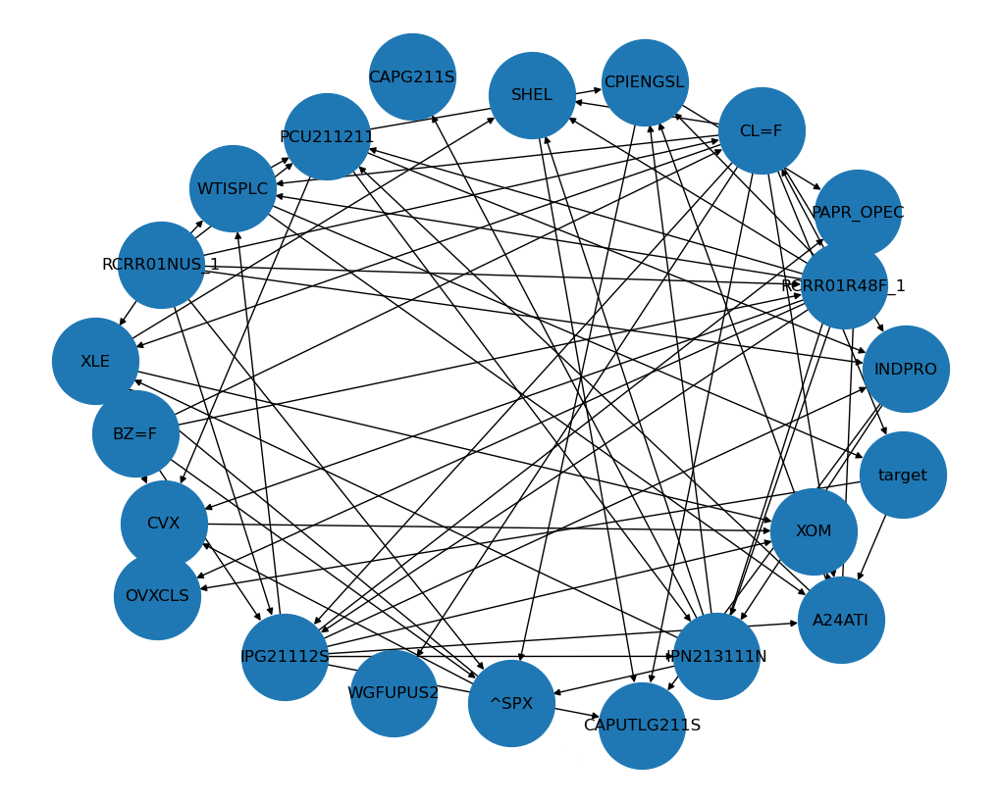

In [22]:
G = nx.DiGraph()
G.add_edges_from(model.edges())
pos = nx.spring_layout(G, k=5)

plt.figure(figsize=(10,8))
# nx.draw_networkx_nodes(G, pos, node_size=10)
# nx.draw_networkx_edges(G, pos, arrows=True)
# nx.draw_networkx_labels(G, pos, labels=custom_labels, font_size=10, font_color='red')
nx.draw(G, pos, with_labels=True, node_size=4000)
plt.show()

## Parameter-Fitting

In [23]:
def handle_missing_cpds(model, data):
    nodes = list(model.nodes)
    for node in nodes:
        if not model.get_cpds(node):
            cardinality = len(data[node].unique())
            values = np.ones(shape=(cardinality, 1)) / cardinality
            cpd = TabularCPD(variable=node, variable_card=cardinality, values=values)
            model.add_cpds(cpd)

        
def validate_cpds(model):
    missing = [node for node in model.nodes() if not model.get_cpds(node)]
    if missing:
        raise ValueError(f"Missing CPDs for: {missing}")

In [24]:
start = time.time()
model.fit(
    cpcv_train_encoded,
    estimator=BayesianEstimator,
    prior_type="K2"
)
handle_missing_cpds(model, data)
stop = time.time()
print(f"Time: {(stop-start):.2f} [sec]")

validate_cpds(model)

Time: 0.03 [sec]


In [25]:
pred_labels = [TARGET_LABEL]
dataset = cpcv_train_encoded
y_pred = model.predict(dataset.drop(pred_labels, axis=1))[pred_labels]
y_true = dataset[pred_labels]
accuracy = accuracy_score(y_true=y_true, y_pred=y_pred)

  0%|          | 0/1326 [00:00<?, ?it/s]

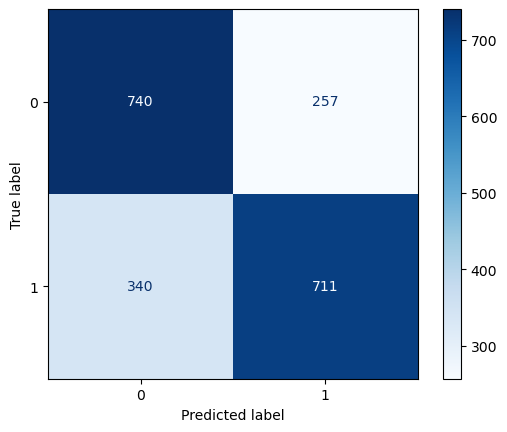

Row sums (True Labels): [ 997 1051]
Column sums (Predicted Labels): [1080  968]
Accuracy: 0.708
Precision: 0.735
Recall: 0.676
F1 Score: 0.704
P(pred=0): 0.527
P(pred=1): 0.473
P(true=0): 0.487
P(true=1): 0.513


In [26]:
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot(cmap='Blues')
plt.show()

print(f"Row sums (True Labels): {cm.sum(axis=1)}")
print(f"Column sums (Predicted Labels): {cm.sum(axis=0)}")
print(f"Accuracy: {accuracy:.3f}")
print(f"Precision: {precision_score(y_true=y_true, y_pred=y_pred):.3f}")
print(f"Recall: {recall_score(y_true=y_true, y_pred=y_pred):.3f}")
print(f"F1 Score: {f1_score(y_true=y_true, y_pred=y_pred):.3f}")
print(f"P(pred=0): {(1 - y_pred).mean()[0]:.3f}")
print(f"P(pred=1): {y_pred.mean()[0]:.3f}")
print(f"P(true=0): {(1 - y_true).mean()[0]:.3f}")
print(f"P(true=1): {y_true.mean()[0]:.3f}")

## Predicting on CPCV Val

In [27]:
pred_labels = [TARGET_LABEL]
dataset = cpcv_val_encoded
logging.getLogger("pgmpy").disabled = True
y_pred = model.predict(dataset.drop(pred_labels, axis=1))[pred_labels]
y_true = dataset[pred_labels]
accuracy = accuracy_score(y_true=y_true, y_pred=y_pred)

  0%|          | 0/532 [00:00<?, ?it/s]

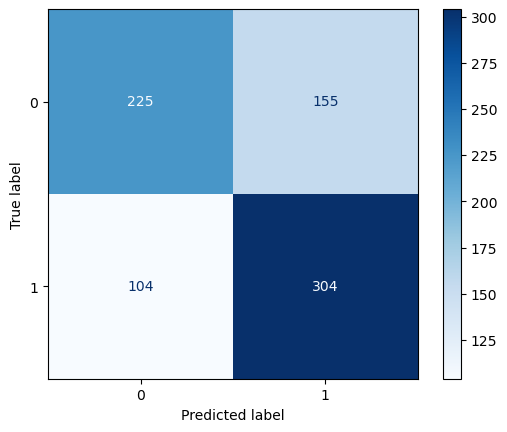

Row sums (True Labels): [380 408]
Column sums (Predicted Labels): [329 459]
Accuracy: 0.671
Precision: 0.662
Recall: 0.745
F1 Score: 0.701
P(pred=0): 0.418
P(pred=1): 0.582
P(true=0): 0.482
P(true=1): 0.518


In [28]:
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)

disp.plot(cmap='Blues')
plt.show()

print(f"Row sums (True Labels): {cm.sum(axis=1)}")
print(f"Column sums (Predicted Labels): {cm.sum(axis=0)}")
print(f"Accuracy: {accuracy:.3f}")
print(f"Precision: {precision_score(y_true=y_true, y_pred=y_pred):.3f}")
print(f"Recall: {recall_score(y_true=y_true, y_pred=y_pred):.3f}")
print(f"F1 Score: {f1_score(y_true=y_true, y_pred=y_pred):.3f}")
print(f"P(pred=0): {(1 - y_pred).mean()[0]:.3f}")
print(f"P(pred=1): {y_pred.mean()[0]:.3f}")
print(f"P(true=0): {(1 - y_true).mean()[0]:.3f}")
print(f"P(true=1): {y_true.mean()[0]:.3f}")

# Model Development Pipeline

In [29]:
class ModelDevelopmentPipeline:
    """Executes the entire model development process:
            1. Discretization (Train + Val)
            2. Parameter Fitting for the HMM (Train)
            2. Regime Encoding via HMM (Train + Val)
            3. Structure Fitting for the Bayesian Network  (Train)
            4. Parameter Fitting for the Bayesian Network (Train)
            5. Performance Evaluation (Val)
    
        Returns the model and performance metrics.
    """

    def __init__(
        self,
        features_to_encode: list,
        hmm_verbosity: int,
        edges: list,
        hidden_states: list,
        starts: list,
        max_indegree: int,
        expert_edges: list,
        pred_labels: list,
        return_model: bool=False
    ) -> None:
        self.features_to_encode = features_to_encode
        self.hmm_verbosity = hmm_verbosity
        self.edges = edges
        self.hidden_states = hidden_states
        self.starts = starts
        self.max_indegree = max_indegree
        self.expert_edges = expert_edges
        self.pred_labels = pred_labels
        self.return_model = return_model

        self.train_discrete = None
        self.hmm = None
        self.model = None

        self.discretizer = SimpleDiscretizer()

    def fit(self, train_dataset: pd.DataFrame) -> None:
        # Fit Discretizer
        self.discretizer.fit(train_dataset)
        train_discrete = self.discretizer.transform(train_dataset)

        # Fit HMM
        self.hmm = HMMEncoder(
            allowed_features=self.features_to_encode,
            hidden_state_emission_priors=self.hidden_states,
            transition_priors=self.edges,
            start_priors=self.starts,
        )
        self.hmm.fit(train_discrete, verbose=self.hmm_verbosity)        
        train_encoded = self.hmm.encode(train_discrete)

        # Fit BN Structure
        hc = HillClimbSearch(data=train_encoded)
        expert = DiscreteBayesianNetwork()
        expert.add_nodes_from(train_encoded.columns)
        expert.add_edges_from(self.expert_edges)
        self.model = hc.estimate(
            scoring_method=K2(data=train_encoded),
            start_dag=expert,
            max_indegree=self.max_indegree
        )
        verify_all_nodes_connected_to_graph(self.model)

        # Fit BN Parameters
        self.model.fit(
            train_encoded,
            estimator=BayesianEstimator,
            prior_type="K2"
        )
        handle_missing_cpds(self.model, train_encoded)
        validate_cpds(self.model)
    
    def predict(
        self,
        pred_dataset: pd.DataFrame,
        pred_labels: list,
    ) -> dict:
        """Returns the model's predictions for pred_labels over pred_dataset."""
        pred_discrete = self.discretizer.transform(pred_dataset)
        pred_encoded = self.hmm.encode(pred_discrete)
        y_pred = self.model.predict(pred_encoded.drop(pred_labels, axis=1))[pred_labels]
        return y_pred

    def evaluate(
        self,
        pred_dataset: pd.DataFrame,
        pred_labels: list,
    ) -> dict:
        """Returns performance statistics."""
        pred_discrete = self.discretizer.transform(pred_dataset)
        pred_encoded = self.hmm.encode(pred_discrete)
        y_pred = self.model.predict(pred_encoded.drop(pred_labels, axis=1))[pred_labels]
        y_true = pred_encoded[pred_labels]

        accuracy = accuracy_score(y_true=y_true, y_pred=y_pred)
        precision = precision_score(y_true=y_true, y_pred=y_pred)
        recall = recall_score(y_true=y_true, y_pred=y_pred)
        f1 = f1_score(y_true=y_true, y_pred=y_pred)

        performance_stats = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1,
        } 
        return performance_stats

In [30]:
####################################################################################
# Define Settings
####################################################################################
# Settings for encoder
features_to_encode = yf_features  

# Settings for HMM: hidden state transitions, emissions, and starts
hmm_verbosity = 0
edges = [
    [0.90, 0.05, 0.05],
    [0.05, 0.90, 0.05],
    [0.05, 0.05, 0.90]
]
hs_bear = Categorical([[0.6, 0.4]])
hs_stag = Categorical([[0.5, 0.5]])
hs_bull = Categorical([[0.4, 0.6]])
hidden_states = [hs_bear, hs_stag, hs_bull]
starts = [0.3, 0.3, 0.4]  

# Settings for Hill Climb Search
max_indegree = 4
expert_edges = [
    ('^SPX', 'XLE'),  # Market influences the sector in a top-down fashion
    ('PCU211211', 'CPIENGSL'),  # Producer price probably influences consumer prices
    ('IPN213111N', 'CAPG211S'),  # Drilling influences capacity
]

# Settings for prediction
pred_labels = [TARGET_LABEL]

# Settings for returned values
return_model = False


####################################################################################
# Iterate Through Combinatorial Cross Validation (CPCV) Train and Val Sets
####################################################################################
performance_results = []
markov_blanket_nodes = []
for i in range(cpcv.n_groups):
    cpcv_idxs = cpcv.get_group_idxs(combo_idx=i)
    cpcv_data = cpcv.get_cpcv_sets(combo_idx=i)
    cpcv_train = cpcv_data['cpcv_train']
    cpcv_val = cpcv_data['cpcv_val']

    mdp = ModelDevelopmentPipeline(
        features_to_encode=features_to_encode,
        hmm_verbosity=hmm_verbosity,
        edges=edges,
        hidden_states=hidden_states,
        starts=starts,
        max_indegree=max_indegree,
        expert_edges=expert_edges,
        pred_labels=pred_labels,
        return_model=return_model
    )
    mdp.fit(train_dataset=cpcv_train)
    single_performance_result = mdp.evaluate(pred_dataset=cpcv_val, pred_labels=pred_labels)
    performance_results.append(single_performance_result)
    markov_blanket_nodes = markov_blanket_nodes + mdp.model.get_markov_blanket(TARGET_LABEL)
    

performance_results_cpcv = pd.DataFrame(performance_results)
performance_results_cpcv

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/532 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/499 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/473 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/517 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/467 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/479 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/538 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/499 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/483 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/516 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/513 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/488 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/471 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/518 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/533 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/476 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/509 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/452 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/514 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/507 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/487 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/446 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/529 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/526 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/518 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/467 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/477 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/511 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/487 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/501 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/457 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/519 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/515 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/486 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/455 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/519 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/531 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/525 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/479 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/505 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/509 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/447 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/515 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/509 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/518 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/486 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/517 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/485 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/470 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/426 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/491 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

/var/folders/57/nmtlyvms16b9m26k6y703_000000gn/T/ipykernel_20269/2302441402.py:9: UserWarning: Disconnected nodes: ['WGFUPUS2']
  warnings.warn(f"Disconnected nodes: {disconnected_nodes}")


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/478 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/446 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/517 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/520 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/495 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/466 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/470 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/465 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/470 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/425 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/427 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/449 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/455 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/457 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/465 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/418 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/423 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/444 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/424 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/441 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/446 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/447 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/405 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/386 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/433 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/420 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/423 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/383 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/461 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

/var/folders/57/nmtlyvms16b9m26k6y703_000000gn/T/ipykernel_20269/2302441402.py:9: UserWarning: Disconnected nodes: ['WGFUPUS2']
  warnings.warn(f"Disconnected nodes: {disconnected_nodes}")


  0%|          | 0/459 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/450 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/408 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/443 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/429 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/436 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/431 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/391 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/447 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/451 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/452 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/447 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/438 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/397 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/428 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/451 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/440 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/431 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

/var/folders/57/nmtlyvms16b9m26k6y703_000000gn/T/ipykernel_20269/2302441402.py:9: UserWarning: Disconnected nodes: ['WGFUPUS2']
  warnings.warn(f"Disconnected nodes: {disconnected_nodes}")


  0%|          | 0/431 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/418 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/403 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/432 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/417 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/431 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/446 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

/var/folders/57/nmtlyvms16b9m26k6y703_000000gn/T/ipykernel_20269/2302441402.py:9: UserWarning: Disconnected nodes: ['WGFUPUS2']
  warnings.warn(f"Disconnected nodes: {disconnected_nodes}")


  0%|          | 0/438 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/445 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/446 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/421 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/421 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/414 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/452 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/501 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/519 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/530 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/468 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/502 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/514 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/529 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/494 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/487 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/512 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/504 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/497 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/448 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/395 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/387 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/413 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/395 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/409 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

/var/folders/57/nmtlyvms16b9m26k6y703_000000gn/T/ipykernel_20269/2302441402.py:9: UserWarning: Disconnected nodes: ['WGFUPUS2']
  warnings.warn(f"Disconnected nodes: {disconnected_nodes}")


  0%|          | 0/403 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/394 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/376 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/387 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/395 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/393 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/398 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/481 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/401 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/370 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/389 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/403 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/405 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/493 [00:00<?, ?it/s]

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/474 [00:00<?, ?it/s]

,accuracy,precision,recall,f1
0,0.671320,0.662309,0.745098,0.701269
1,0.681472,0.670270,0.657825,0.663989
2,0.667513,0.698582,0.526738,0.600610
3,0.710089,0.738318,0.623684,0.676177
4,0.705584,0.669643,0.781250,0.721154
...,...,...,...,...
160,0.678161,0.674817,0.698734,0.686567
161,0.674330,0.749288,0.611628,0.673496
162,0.659004,0.660714,0.720195,0.689173
163,0.653895,0.680804,0.704388,0.692395


## CPCV Evaluation: Distribution of Performance Metrics

Train Occurences of Target=1: 1472
Train Occurences of Target=0: 1404
Train P(Target=1) = 0.51



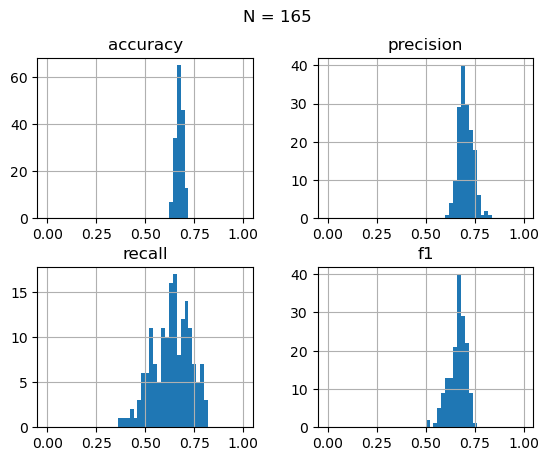

,accuracy,precision,recall,f1
count,165.000000,165.000000,165.000000,165.000000
mean,0.672957,0.703324,0.635368,0.661448
std,0.018529,0.036914,0.094505,0.044582
min,0.620690,0.608000,0.369501,0.504000
25%,0.660281,0.678873,0.574661,0.635945
50%,0.674330,0.698598,0.642487,0.667568
75%,0.684010,0.727273,0.706633,0.692488
max,0.714467,0.822917,0.812500,0.742857


In [31]:
x = (train_df[TARGET_LABEL] > 0) * 1

print(f"Train Occurences of Target=1: {x.sum()}")
print(f"Train Occurences of Target=0: {(1 - x).sum()}")
print(f"Train P(Target=1) = {x.mean():.2f}")
print()

performance_results_cpcv.hist(bins=np.linspace(0., 1., 51))
plt.suptitle(f"N = {cpcv.n_groups}")
plt.show()

display(performance_results_cpcv.describe())

Features with 0 occurences:
['CAPUTLG211S']



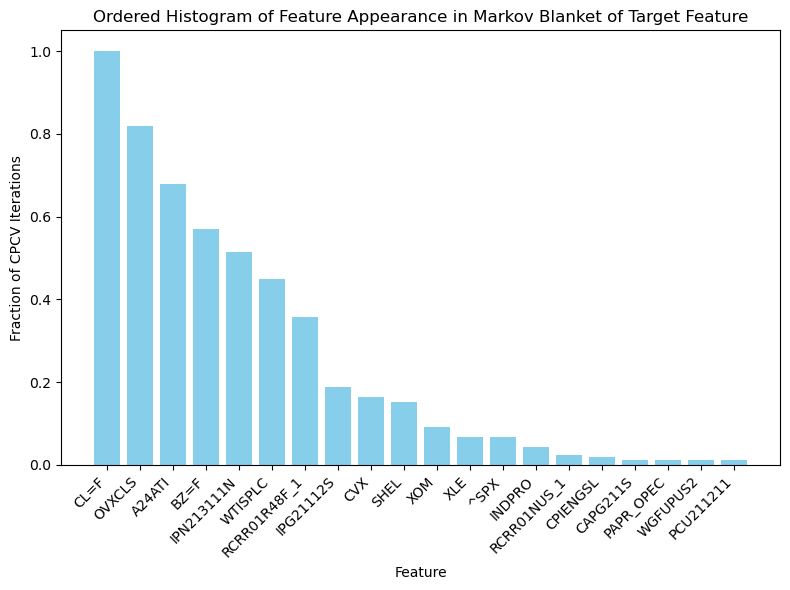

,feature,% occurence
0,CL=F,1.000000
1,OVXCLS,0.818182
2,A24ATI,0.678788
3,BZ=F,0.569697
4,IPN213111N,0.515152
5,WTISPLC,0.448485
6,RCRR01R48F_1,0.357576
7,IPG21112S,0.187879
8,CVX,0.163636
9,SHEL,0.151515


In [32]:
# Count the occurrences of each label
node_counts = Counter(markov_blanket_nodes)
sorted_nodes = sorted(node_counts.items(), key=lambda item: item[1], reverse=True)

# Separate labels and counts for plotting
ordered_nodes = [label for label, count in sorted_nodes]
ordered_pcts = [count / cpcv.n_groups for label, count in sorted_nodes]

excluded = [label for label in train_df.columns if label not in ordered_nodes and label != TARGET_LABEL]
print(f"Features with 0 occurences:")
print(excluded)
print()

# Create the histogram (bar plot)
plt.figure(figsize=(8, 6)) # Adjust figure size as needed
plt.bar(ordered_nodes, ordered_pcts, color='skyblue')
plt.xlabel("Feature")
plt.ylabel("Fraction of CPCV Iterations")
plt.title("Ordered Histogram of Feature Appearance in Markov Blanket of Target Feature")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

excluded = [
    label for label in train_df.columns 
    if (label not in markov_blanket_nodes) and (label != TARGET_LABEL)
]

pd.DataFrame({'feature': ordered_nodes, '% occurence': ordered_pcts})

# Performance on Validation Set

Now that we've seen our *model development process* perform acceptably well in Combinatorial Purged Cross Validation, we will retrain the model on the entire Train set and evaluate its performance on the Validation set for the first time.

In [33]:
####################################################################################
# Define Settings
####################################################################################
# Settings for encoder
features_to_encode = yf_features  

# Settings for HMM: hidden state transitions, emissions, and starts
hmm_verbosity = 0
edges = [
    [0.90, 0.05, 0.05],
    [0.05, 0.90, 0.05],
    [0.05, 0.05, 0.90]
]
hs_bear = Categorical([[0.6, 0.4]])
hs_stag = Categorical([[0.5, 0.5]])
hs_bull = Categorical([[0.4, 0.6]])
hidden_states = [hs_bear, hs_stag, hs_bull]
starts = [0.3, 0.3, 0.4]  

# Settings for Hill Climb Search
max_indegree = 4
expert_edges = [
    ('^SPX', 'XLE'),  # Market influences the sector in a top-down fashion
    ('PCU211211', 'CPIENGSL'),  # Producer price probably influences consumer prices
    ('IPN213111N', 'CAPG211S'),  # Drilling influences capacity
]

# Settings for prediction
pred_labels = [TARGET_LABEL]

# Settings for returned values
return_model = True


####################################################################################
# Iterate Through Combinatorial Cross Validation (CPCV) Train and Val Sets
####################################################################################
mdp = ModelDevelopmentPipeline(
    features_to_encode=features_to_encode,
    hmm_verbosity=hmm_verbosity,
    edges=edges,
    hidden_states=hidden_states,
    starts=starts,
    max_indegree=max_indegree,
    expert_edges=expert_edges,
    pred_labels=pred_labels,
    return_model=return_model
)
mdp.fit(train_dataset=train_df.iloc[:-TARGET_HORIZON_DAYS])
single_performance_result = mdp.evaluate(pred_dataset=val_df, pred_labels=pred_labels)

y_true = mdp.discretizer.transform(val_df[pred_labels])[TARGET_LABEL]
y_pred = mdp.predict(pred_dataset=val_df, pred_labels=pred_labels)[TARGET_LABEL]

mu_true = y_true.mean()
mu_pred = y_pred.mean()

balance_of_values = pd.DataFrame({
    'Y_true': [mu_true, 1 - mu_true],
    'Y_pred': [mu_pred, 1 - mu_pred] 
})

print("\nDistribution of Values in Data and Model:")
display(balance_of_values)

performance_summary = pd.DataFrame([single_performance_result])
display(performance_summary)

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/646 [00:00<?, ?it/s]

  0%|          | 0/646 [00:00<?, ?it/s]


Distribution of Values in Data and Model:


,Y_true,Y_pred
0,0.581349,0.618056
1,0.418651,0.381944


,accuracy,precision,recall,f1
0,0.693452,0.722311,0.767918,0.744417


At first glance, this model development process looks promising: with 67% accuracy in Combinatorial Purged Cross Validation and 69% accuracy on the Validation set, which has 58%/42% split of 1s/0s, the model appears to have a statistical edge. Before we can rely on this edge in our , we need to conduct a permutation test to determine if it is statistically significant.

## Significance of Accuracy Measurement

Expected Median Accuracy: 0.519207


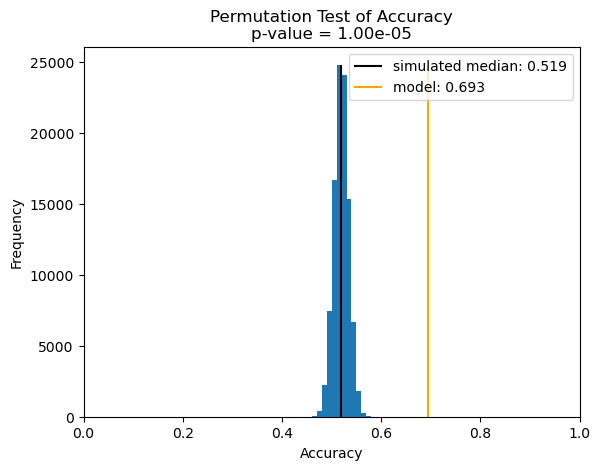

percentile,0,1,5,10,20,50,80,90,95,99,100
accuracy,0.455357,0.485119,0.49504,0.499008,0.506944,0.518849,0.532738,0.53869,0.544643,0.554563,0.582341


In [34]:
mu_expected = mu_true * mu_pred + (1 - mu_true) * (1 - mu_pred)
print(f"Expected Median Accuracy: {mu_expected:.6f}")

accuracy = accuracy_score(y_true=y_true.values, y_pred=y_pred.values)
p, t = permutation_test(
    y_pred=y_pred.values, 
    y_true=y_true.values,
    n_iter=int(1e5)
)
med = np.median(t)

cts, bins, _ = plt.hist(t, bins=np.arange(0., 1., 0.01))
plt.title(f"Permutation Test of Accuracy\np-value = {p:.2e}")
plt.vlines(med, ymin=-1, ymax=cts.max(), colors='k', label=f'simulated median: {med:.3f}')
plt.vlines(accuracy, ymin=-1, ymax=cts.max(), colors='orange', label=f'model: {accuracy:.3f}')
plt.xlim(0, 1)
plt.ylim(0, None)
plt.ylabel("Frequency")
plt.xlabel("Accuracy")
plt.legend()
plt.show()

percentiles = [0, 1, 5, 10, 20, 50, 80, 90, 95, 99, 100]
accuracy_percentiles = pd.DataFrame({
    'percentile': percentiles, 
    'accuracy': np.percentile(t, q=percentiles)
}).set_index('percentile').T
display(accuracy_percentiles)

By the accounting for the distribution of values in the data and the distribution in the model's predictions, we determine that our expected accuracy is 51.9%. The permutation test shows that, in 100,000 worlds where market performance is truly random because no inherent structure exists, our model would have achieved accuracies between 45.7% and 58.6% with a median of 51.9% and a mean of 51.9% (as expected). In the real world, we achieved 69% accuracy. With a p-value of 0.00001, the permutation test reveals a less than 1 in 100,000 chance that our model achieved this level of accuracy by chance, rather than by representing a legitimate structure in the market.

In order to build a profitable trading strategy, however, we need to balance our win rate (how often our hypotheses are correct) with our reward-to-risk ratio (how big of a dent we make on our P&L when we win compared to when we lose). But before we start simulating a trading strategy, we can learn a lot about reward and risk by looking at the distribution of returns conditioned on our model's predictions.

## Visualize Distribution of Predictions and True Returns

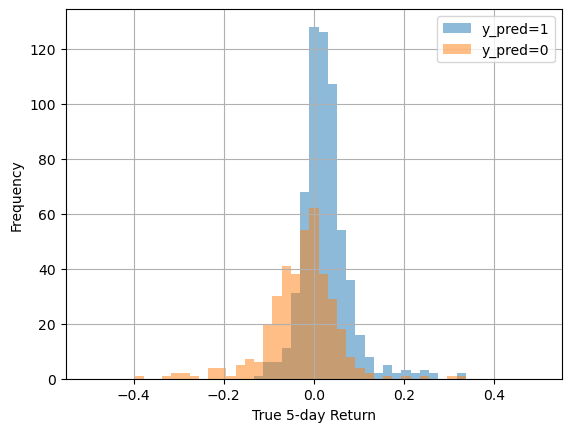

/Users/ryancardenas/anaconda3/envs/demos/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,ypred1,ypred0
mean return,0.026856,-0.036587
mean log return,0.026537,-0.034081
sum log returns: correct,21.241975,-18.440047
sum log returns: wrong,-4.736016,5.353115
net log return,16.505959,-13.086933


In [35]:
pred1 = val_df[y_pred==1][TARGET_LABEL]
pred0 = val_df[y_pred==0][TARGET_LABEL]

pred1.hist(bins=np.linspace(-.5, 0.5, 50), label='y_pred=1', alpha=0.5)
pred0.hist(bins=np.linspace(-.5, 0.5, 50), label='y_pred=0', alpha=0.5)
plt.legend()
plt.xlabel(f"True {TARGET_HORIZON_DAYS}-day Return")
plt.ylabel("Frequency")
plt.show()

data = {
    'ypred1': [
        pred1.mean(),
        np.log(pred1 + 1).mean(),
        np.log(pred1[pred1 > 0] + 1).sum(),
        np.log(pred1[pred1 <= 0] + 1).sum(),
        np.log(pred1[pred1 > 0] + 1).sum() + np.log(pred1[pred1 <= 0] + 1).sum()
    ],
    'ypred0': [
        pred0.mean(),
        np.log(pred0 + 1).mean(),
        np.log(pred0[pred0 < 0] + 1).sum(),
        np.log(pred0[pred0 >= 0] + 1).sum(),
        np.log(pred0[pred0 < 0] + 1).sum() + np.log(pred0[pred0 >= 0] + 1).sum()
    ]
}
val_returns = pd.DataFrame(
    data, 
    index=[
        'mean return',
        'mean log return',
        'sum log returns: correct',
        'sum log returns: wrong',
        'net log return'
    ]
)
val_returns

As hoped, the times when the model predicts positive price changes have a mean return of +2.6% (including the times when the model is wrong); likewise, the time when the model predicts negative price changes have a mean return of -3.6%. In other words, the model is providing a signal that could probably support a profitable trading strategy. To see if that is true in aggregate, we will use logarithms to transform our returns into log returns, which can be added up over time (as opposed to regular returns which must be summed with 1.0 and then multiplied).  The "mean log return" accounts for the compounding nature of returns and confirms what the arithmetic mean reveals.

If we consider the sum of log returns whenever the model makes a correct prediction and compare that to the sum of log returns whenever the model's prediction is wrong, we can determine whether the net log return is agreeable. As we can see from our data table, the model has a net log return of +1651% for positive predictions over the four years from Jan 2019 to the end of 2022, while the model has a net log return of -1309% for negative predictions. These net log returns include all the cases where the model predictions were wrong. That's a great sign: we want the true returns to be cumulatively negative whenever the model predicts a "0" (a price decline) and we want the true returns to be cumulatively positive whenever the model predicts a "1".

During computation of the log returns, numpy threw a RuntimeWarning telling us there was an invalid value. This often occurs because of negative values, for which logarithms are undefined. Let's take a look at all the cases in our validation set where the 5-day returns might have been worse that -100%:

In [36]:
val_df[val_df[TARGET_LABEL]<=-1.]

,target,BZ=F,CL=F,CVX,SHEL,XLE,XOM,^SPX,A24ATI,CAPG211S,...,IPG21112S,IPN213111N,INDPRO,OVXCLS,PCU211211,WTISPLC,PAPR_OPEC,RCRR01NUS_1,RCRR01R48F_1,WGFUPUS2
Date,,,,,,,,,,,,,,,,,,,,,
2020-04-20,-2.679161,-0.089387,-3.059661,-0.041299,-0.056370,-0.031222,-0.047200,-0.017881,-0.146382,-0.000836,...,-0.062612,-0.257647,-0.132418,1.357731,-0.326757,-0.433413,0.066359,-0.189088,-0.135802,0.045267
2020-04-27,-1.339623,-0.067631,-0.245573,0.031031,0.022552,0.021664,0.004802,0.014714,-0.146382,-0.000836,...,-0.062612,-0.257647,-0.132418,0.068807,-0.326757,-0.433413,0.066359,-0.189088,-0.135802,0.103370


We can now see exactly where the target variable experienced such a large negative return that log(1 + r) threw a warning: once on the infamous April 20, 2020, when oil prices went *negative* because COVID caused people to stop driving and oil storage costs were priced higher than the value of the oil itself; and once more on April 27 -- exactly five trading days later -- because even though the *absolute return* was positive, the *percent return* was negative due to the negative entry price on April 20. This exceptional market event posed a massive risk to anyone who was fully invested or worse, overleveraged, in oil during that time. The only way I can think of to mitigate that kind of risk in the future is to not allocate too large a fraction of one's portfolio on any single trade or instrument. That said, for the purposes of testing our model in a trading strategy, we will allow full allocation.

# Model Performance on Test Set with a Toy Trading Strategy

Since our primary goal here is to demonstrate the usefulness of HMM-encoded regimes and Bayesian Networks, we won't spend too much time developing a robust trading strategy or strategy development framework. Instead, we will train a model using the same process as before, but this time on the combined Train-Val sets. We will then retrieve the model's predictions over the entire Test set and simulate the realized profit-and-loss for two strategies: a simple long-only strategy and a long-short strategy. 

The rules for the long-only strategy are as follows:
- If model predicts a price increase, go long with a 20% allocation of portfolio funds (since the prediction horizon is 5 days, so we can have up to 5 concurrently open trades). Exit positions at the close of the fifth day.
- If the model predicts a price decrease, do nothing. Do not close open positions; do not open new positions.

The rules for the long-short strategy are as follows:
- If model predicts a price increase, go long with a 20% allocation of portfolio funds (since the prediction horizon is 5 days, so we can have up to 5 concurrently open trades). Exit positions at the close of the fifth day.
- If the model predicts a price decrease, go short with a 20% allocation of portfolio funds. Exit positions at the close of the fifth day. Note that, in the USA, certain laws prevent traders from entering

We will model trading fees, slippage, and margin interest, as a bundled per-trade expense. As of September 1st, 2025, Schwab's pricing table shows a 2.25 USD per-contract fee for futures while Yahoo Finance lists CL=F at 64.92 USD per barrel for contracts of 1000 barrels each, so the 4.50 USD round-trip trading fee on a single 64,920 USD contract represents 0.007%. Combine that with Schwab's ~12% annualized margin interest rate over the 5 days each position will remain open, we arrive at fees representing 0.17% of each trade (Schwab's 2.25 USD trading fee is neglible). Tack on +/- 5 cents of average slippage on each trade for a total 0.25%. We will round this up to 0.3% per trade to be on the safe side.

$$\text{Trading Fees} + \text{ Margin Interest} + \text{ Slippage} = \frac{4.50}{64920} + 5 * \frac{0.12}{360} + \frac{0.05}{64.92} = 0.0025 \approx 0.3\% \text{ per trade}$$

For simplicity, we will allow fractional positions in all strategies. We will not model stop orders, unrealized P&L due to intraday price action, or margin maintenance requirements. Concurrent long and short positions are allowed, because traders or firms may manage long/short positions on the same instrument in seperate accounts.

## Retrain on Train + Val

In [37]:
####################################################################################
# Define Settings
####################################################################################
# Settings for encoder
features_to_encode = yf_features  

# Settings for HMM: hidden state transitions, emissions, and starts
hmm_verbosity = 0
edges = [
    [0.90, 0.05, 0.05],
    [0.05, 0.90, 0.05],
    [0.05, 0.05, 0.90]
]
hs_bear = Categorical([[0.6, 0.4]])
hs_stag = Categorical([[0.5, 0.5]])
hs_bull = Categorical([[0.4, 0.6]])
hidden_states = [hs_bear, hs_stag, hs_bull]
starts = [0.3, 0.3, 0.4]  

# Settings for Hill Climb Search
max_indegree = 4
expert_edges = [
    ('^SPX', 'XLE'),  # Market influences the sector in a top-down fashion
    ('PCU211211', 'CPIENGSL'),  # Producer price probably influences consumer prices
    ('IPN213111N', 'CAPG211S'),  # Drilling influences capacity
]

# Settings for prediction
pred_labels = [TARGET_LABEL]

# Settings for returned values
return_model = True


####################################################################################
# Iterate Through Combinatorial Cross Validation (CPCV) Train and Val Sets
####################################################################################

train_val_data = pd.concat([train_df, val_df]).iloc[:-TARGET_HORIZON_DAYS]

mdp = ModelDevelopmentPipeline(
    features_to_encode=features_to_encode,
    hmm_verbosity=hmm_verbosity,
    edges=edges,
    hidden_states=hidden_states,
    starts=starts,
    max_indegree=max_indegree,
    expert_edges=expert_edges,
    pred_labels=pred_labels,
    return_model=return_model
)
mdp.fit(train_dataset=train_val_data)
single_performance_result = mdp.evaluate(pred_dataset=test_df, pred_labels=pred_labels)

y_true = mdp.discretizer.transform(test_df[pred_labels])[TARGET_LABEL]
y_pred = mdp.predict(pred_dataset=test_df, pred_labels=pred_labels)[TARGET_LABEL]

mu_true = y_true.mean()
mu_pred = y_pred.mean()

balance_of_values = pd.DataFrame({
    'Y_true': [mu_true, 1 - mu_true],
    'Y_pred': [mu_pred, 1 - mu_pred] 
})

print("\nDistribution of Values in Data and Model:")
display(balance_of_values)

performance_summary = pd.DataFrame([single_performance_result])
display(performance_summary)

  0%|          | 0/1000000 [00:00<?, ?it/s]

  0%|          | 0/447 [00:00<?, ?it/s]

  0%|          | 0/447 [00:00<?, ?it/s]


Distribution of Values in Data and Model:


,Y_true,Y_pred
0,0.508955,0.407463
1,0.491045,0.592537


,accuracy,precision,recall,f1
0,0.677612,0.728938,0.583578,0.648208


## Significance of Accuracy on Test

Expected Median Accuracy: 0.498343


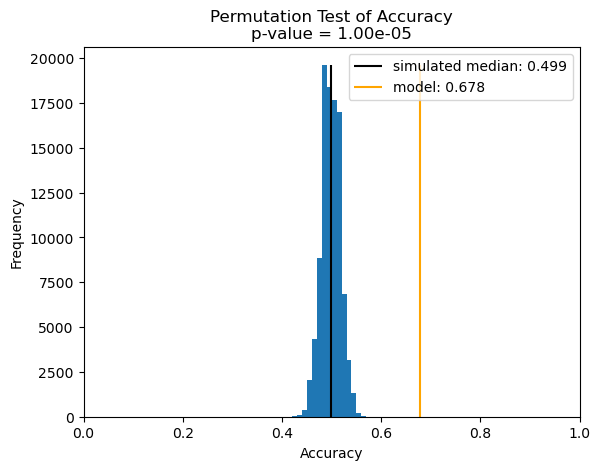

percentile,0,1,5,10,20,50,80,90,95,99,100
accuracy,0.408955,0.453731,0.465672,0.474627,0.483582,0.498507,0.513433,0.522388,0.528358,0.543284,0.579104


In [38]:
mu_expected = mu_true * mu_pred + (1 - mu_true) * (1 - mu_pred)
print(f"Expected Median Accuracy: {mu_expected:.6f}")

accuracy = accuracy_score(y_true=y_true.values, y_pred=y_pred.values)
p, t = permutation_test(
    y_pred=y_pred.values, 
    y_true=y_true.values,
    n_iter=int(1e5)
)
med = np.median(t)

cts, bins, _ = plt.hist(t, bins=np.arange(0., 1., 0.01))
plt.title(f"Permutation Test of Accuracy\np-value = {p:.2e}")
plt.vlines(med, ymin=-1, ymax=cts.max(), colors='k', label=f'simulated median: {med:.3f}')
plt.vlines(accuracy, ymin=-1, ymax=cts.max(), colors='orange', label=f'model: {accuracy:.3f}')
plt.xlim(0, 1)
plt.ylim(0, None)
plt.ylabel("Frequency")
plt.xlabel("Accuracy")
plt.legend()
plt.show()

percentiles = [0, 1, 5, 10, 20, 50, 80, 90, 95, 99, 100]
accuracy_percentiles = pd.DataFrame({
    'percentile': percentiles, 
    'accuracy': np.percentile(t, q=percentiles)
}).set_index('percentile').T
display(accuracy_percentiles)

As with the Validation set, the model's accuracy metric on the Test set is statistically significant to the 0.00001 level, according to permutation testing.

## Visualize Distribution of Predictions and True Returns

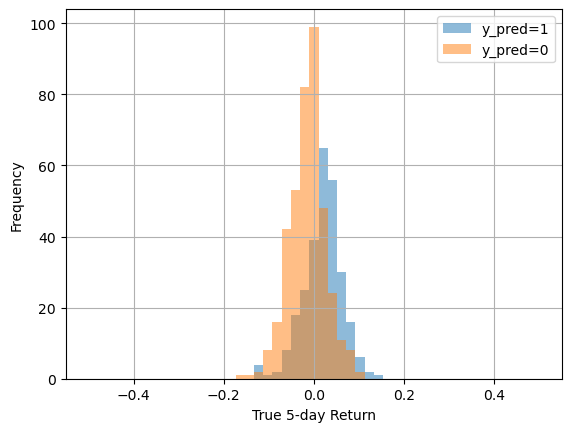

,ypred1,ypred0
mean return,0.019128,-0.014163
mean log return,0.018010,-0.015124
sum log returns: correct,7.635203,-9.687861
sum log returns: wrong,-2.718341,3.683609
net log return,4.916862,-6.004252


In [39]:
pred1 = test_df[y_pred==1][TARGET_LABEL]
pred0 = test_df[y_pred==0][TARGET_LABEL]

pred1.hist(bins=np.linspace(-.5, 0.5, 50), label='y_pred=1', alpha=0.5)
pred0.hist(bins=np.linspace(-.5, 0.5, 50), label='y_pred=0', alpha=0.5)
plt.legend()
plt.xlabel(f"True {TARGET_HORIZON_DAYS}-day Return")
plt.ylabel("Frequency")
plt.show()

data = {
    'ypred1': [
        pred1.mean(),
        np.log(pred1 + 1).mean(),
        np.log(pred1[pred1 > 0] + 1).sum(),
        np.log(pred1[pred1 <= 0] + 1).sum(),
        np.log(pred1[pred1 > 0] + 1).sum() + np.log(pred1[pred1 <= 0] + 1).sum()
    ],
    'ypred0': [
        pred0.mean(),
        np.log(pred0 + 1).mean(),
        np.log(pred0[pred0 < 0] + 1).sum(),
        np.log(pred0[pred0 >= 0] + 1).sum(),
        np.log(pred0[pred0 < 0] + 1).sum() + np.log(pred0[pred0 >= 0] + 1).sum()
    ]
}
test_returns = pd.DataFrame(
    data, 
    index=[
        'mean return',
        'mean log return',
        'sum log returns: correct',
        'sum log returns: wrong',
        'net log return'
    ]
)
test_returns

As with the Validation set, the model's predictions tend to match the skew of the market's returns.

## Simulate Long-Only and Long-Short Strategies Guided by Model's Predictions

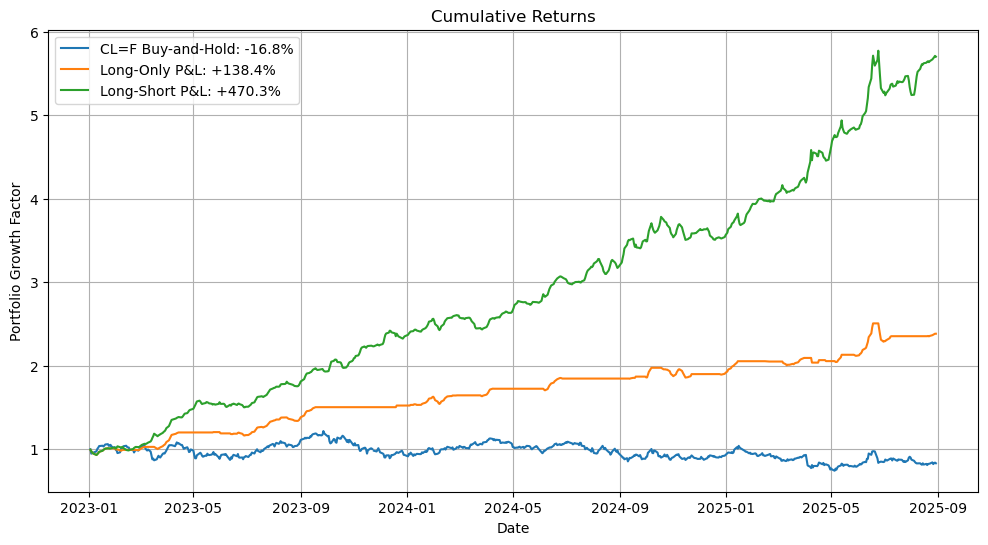

In [40]:
fees_per_trade = 0.003
returns_long_only = np.full(shape=y_pred.shape, fill_value=np.nan)
returns_long_short = np.full(shape=y_pred.shape, fill_value=np.nan)
for i in range(y_pred.shape[0]):
    if y_pred.iloc[i] == 1:
        returns_long_only[i] = test_df.loc[y_pred.index[i], TARGET_LABEL] - fees_per_trade
        returns_long_short[i] = test_df.loc[y_pred.index[i], TARGET_LABEL] - fees_per_trade
    elif y_pred.iloc[i] == 0:
        returns_long_only[i] = 0.  # No trade, no fees!
        returns_long_short[i] = -test_df.loc[y_pred.index[i], TARGET_LABEL] - fees_per_trade
    else:
        raise ValueError(f"Predictions should be either 1 or 0; received {y_pred.iloc[i]}")

# Each return is multiplied by (1 / TARGET_HORIZON_DAYS) to represent the fact that we
# are allocating the same fraction of available funds to each open trade.
pnl_long_only = pd.Series(
    data=((returns_long_only / TARGET_HORIZON_DAYS) + 1).cumprod(),
    index=y_pred.index
)
pnl_long_short = pd.Series(
    data=((returns_long_short / TARGET_HORIZON_DAYS) + 1).cumprod(),
    index=y_pred.index
)

wti_price = yf_df['CL=F'].loc[y_pred.index]

plt.figure(figsize=(12, 6))
plt.plot(wti_price / wti_price.iloc[0], label=f"CL=F Buy-and-Hold: {100 * (wti_price.iloc[-1] / wti_price.iloc[0] - 1):.1f}%")
plt.plot(pnl_long_only, label=f"Long-Only P&L: +{100 * (pnl_long_only[-1] - 1):.1f}%")
plt.plot(pnl_long_short, label=f"Long-Short P&L: +{100 * (pnl_long_short[-1] - 1):.1f}%")
plt.title("Cumulative Returns")
plt.ylabel("Portfolio Growth Factor")
plt.xlabel("Date")
plt.grid()
plt.legend()
plt.show()

Between Jan 2023 and Sept 2025, the buy-and-hold strategy on WTI Oil Futures (where we roll the position at the end of each month when the futures expire) would have lost 16.8%, but the model-informed long-only and long-short strategies would have gained 138.4% and 470.3%, respectively.

# Project Summary

We explored how to use Hidden Markov Model's to encode stock market regimes and how to use Bayesian Networks to predict price movements for oil futures five days in advance. In the process, we:
- Took macro-economic and stock market data from the Yahoo Finance, FRED, and EIA databases, computed percent changes for each series, and shifted each series forward to appropriately capture the lag between the period each data point represents and the time when data becomes available for use in trading.
- Split the data into Train, Validation, and Test sets, performed Combinatorial Purged Cross Validation within the Train set to identify a promising model development process, evaluated that process on the out-of-sample Validation set, and concluded that our process was worth testing in a paper trade simulation. 
- Re-ran the model development process from scratch on the combined Train + Validation sets, and then evaluated the model's performance on the out-of-sample Test set by computing classification metrics (accuracy, precision, recall, f1-score), examining the conditional distributions of true returns given the model's predictions, conducting a permutation test, and comparing the profit-and-losses of two different trading strategies against a baseline buy-and-hold strategy.

Our model provided a statistically significant trading signal that gave two basic strategies enough "edge" to outperform the market from 2023 to late 2025, deploying one-fifth of the portfolio per trade (per day). In the end, these results demonstrated the potential for HMM-informed Bayesian Networks to identify true patterns in oil markets.